In [1]:
import numpy as np
import matplotlib.pyplot as plt
import ultranest
import read_beam_FEKO as rf
import scipy.interpolate
import scipy.optimize
import pandas as pd
%matplotlib notebook

In [4]:
data = pd.read_csv("totalsig.csv",header=None)

In [5]:
data

,0,1,2,3,4,5,6,7,8,9,...,91,92,93,94,95,96,97,98,99,100
0,0.661272,0.655820,0.650289,0.644598,0.639371,0.634294,0.629194,0.624205,0.619667,0.614690,...,0.335342,0.332914,0.330467,0.328090,0.325771,0.323381,0.321291,0.318976,0.317007,0.314722
1,0.702854,0.704749,0.706724,0.708460,0.710611,0.711688,0.713619,0.715347,0.716850,0.718846,...,0.814586,0.815627,0.817356,0.818133,0.819215,0.820302,0.821351,0.822312,0.823283,0.824540
2,41.048706,40.860894,40.677641,40.497743,40.321033,40.147521,39.977343,39.810159,39.645618,39.483732,...,29.957731,29.853207,29.749032,29.643989,29.539736,29.435581,29.331271,29.227068,29.122975,29.019209


In [3]:
o = rf.read_beam_FEKO('nominal.out',0)

 Frequency in Hz:               FREQ =    2.50000E+07

 Frequency in Hz:               FREQ =    2.60000E+07

 Frequency in Hz:               FREQ =    2.70000E+07

 Frequency in Hz:               FREQ =    2.80000E+07

 Frequency in Hz:               FREQ =    2.90000E+07

 Frequency in Hz:               FREQ =    3.00000E+07

 Frequency in Hz:               FREQ =    3.10000E+07

 Frequency in Hz:               FREQ =    3.20000E+07

 Frequency in Hz:               FREQ =    3.30000E+07

 Frequency in Hz:               FREQ =    3.40000E+07

 Frequency in Hz:               FREQ =    3.50000E+07

 Frequency in Hz:               FREQ =    3.60000E+07

 Frequency in Hz:               FREQ =    3.70000E+07

 Frequency in Hz:               FREQ =    3.80000E+07

 Frequency in Hz:               FREQ =    3.90000E+07

 Frequency in Hz:               FREQ =    4.00000E+07

 Frequency in Hz:               FREQ =    4.10000E+07

 Frequency in Hz:               FREQ =    4.20000E+07

 Frequency

In [4]:
# Define theta as an array from [90 to 0]. phi is from [0 to 359], freq from [25 to 125 MHz]
theta = 90 - o[2]
phi = o[1]
freq = o[0]
gain = o[5]
xx, yy = np.meshgrid(theta, phi)
#xx is for theta, and yy is for phi

In [5]:
#The fundamental TDH functions
#Acos,Asin taken theta in degree
sigma = 18
def Acos(R, theta, miu, nu):
    part1 = np.cos(miu*theta*np.pi/180)*(R/(sigma/1.43))**miu
    part2 = P(miu,nu,R**2/(sigma/1.43)**2)
    part3 = np.exp(-R**2/(4*(sigma/1.43)**2))
    return part1*part2*part3

def Asin(R, theta, miu, nu):
    part1 = np.sin(miu*theta*np.pi/180)*(R/(sigma/1.43))**miu
    part2 = P(miu,nu,R**2/(sigma/1.43)**2)
    part3 = np.exp(-R**2/(4*(sigma/1.43)**2))
    return part1*part2*part3

def P(miu,nu,u):
    terms = []
    p = 0
    while p <= nu:
        up = np.math.factorial(miu + nu)*np.math.factorial(nu)
        down = np.math.factorial(miu + p)*np.math.factorial(p)*np.math.factorial(nu-p)
        term = (-2)**(nu-p)* up/down * u**p
        terms.append(term)
        p += 1
    terms = np.array(terms)
    return np.sum(terms,axis = 0)

In [6]:
#make sigma a input parameter
def Acossig(R, theta, miu, nu, sigma):
    part1 = np.cos(miu*theta*np.pi/180)*(R/(sigma/1.43))**miu
    part2 = P(miu,nu,R**2/(sigma/1.43)**2)
    part3 = np.exp(-R**2/(4*(sigma/1.43)**2))
    return part1*part2*part3

def Asinsig(R, theta, miu, nu, sigma):
    part1 = np.sin(miu*theta*np.pi/180)*(R/(sigma/1.43))**miu
    part2 = P(miu,nu,R**2/(sigma/1.43)**2)
    part3 = np.exp(-R**2/(4*(sigma/1.43)**2))
    return part1*part2*part3

In [7]:
zz00c = Acos(xx, yy, 0, 0)

zz10c = Acos(xx, yy, 1, 0)
zz10s = Asin(xx, yy, 1, 0)

zz20c = Acos(xx, yy, 2, 0)
zz01c = Acos(xx, yy, 0, 1)
zz20s = Asin(xx, yy, 2, 0)

zz30c = Acos(xx, yy, 3, 0)
zz11c = Acos(xx, yy, 1, 1)
zz11s = Asin(xx, yy, 1, 1)
zz30s = Asin(xx, yy, 3, 0)

zz40c = Acos(xx, yy, 4, 0)
zz21c = Acos(xx, yy, 2, 1)
zz02c = Acos(xx, yy, 0, 2)
zz21s = Asin(xx, yy, 2, 1)
zz40s = Asin(xx, yy, 4, 0)

zz50c = Acos(xx, yy, 5, 0)
zz31c = Acos(xx, yy, 3, 1)
zz12c = Acos(xx, yy, 1, 2)
zz12s = Asin(xx, yy, 1, 2)
zz31s = Asin(xx, yy, 3, 1)
zz50s = Asin(xx, yy, 5, 0)

zz60c = Acos(xx, yy, 6, 0)
zz41c = Acos(xx, yy, 4, 1)
zz22c = Acos(xx, yy, 2, 2)
zz03c = Acos(xx, yy, 0, 3)
zz22s = Asin(xx, yy, 2, 2)
zz41s = Asin(xx, yy, 4, 1)
zz60s = Asin(xx, yy, 6, 0)

zz70c = Acos(xx, yy, 7, 0)
zz51c = Acos(xx, yy, 5, 1)
zz32c = Acos(xx, yy, 3, 2)
zz13c = Acos(xx, yy, 1, 3)
zz13s = Asin(xx, yy, 1, 3)
zz32s = Asin(xx, yy, 3, 2)
zz51s = Asin(xx, yy, 5, 1)
zz70s = Asin(xx, yy, 7, 0)

<IPython.core.display.Javascript object>


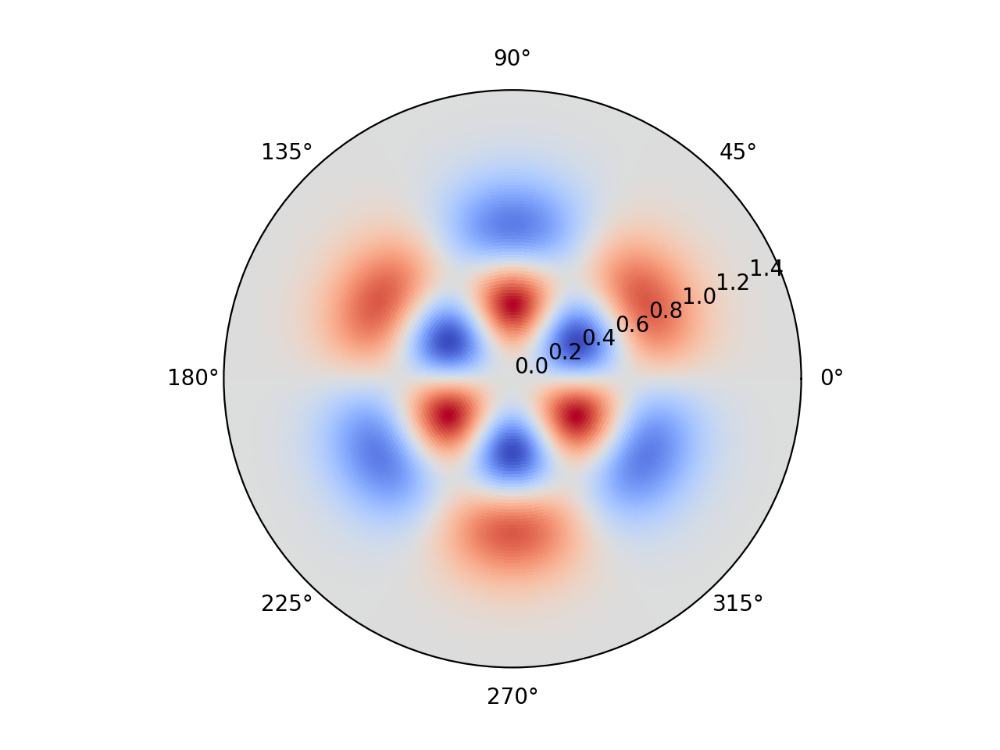

In [7]:
#Plot one mode
fig, axs = plt.subplots(1, 1, subplot_kw=dict(projection="polar"))
axs.pcolormesh(yy*np.pi/180,xx*np.pi/180,zz31s,cmap='coolwarm', shading = 'nearest')

<IPython.core.display.Javascript object>


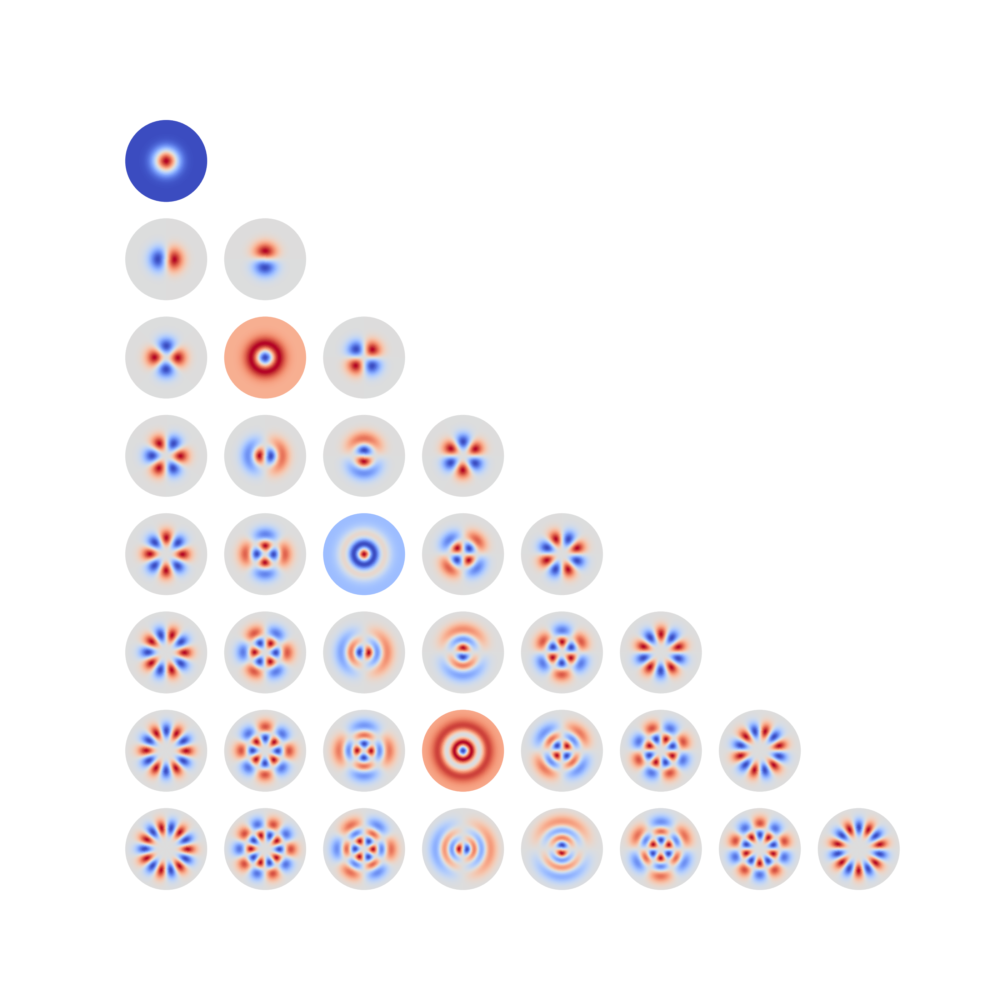

In [147]:
# Plot Total version
fig, axs = plt.subplots(8, 8, subplot_kw=dict(projection="polar"),figsize = (14,14), sharex = True, sharey = True)
for i in range(8):
    for j in range(8):
        axs[i,j].axis('off')
axs[0, 0].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz00c,cmap='coolwarm', label = "00c", shading='nearest')

axs[1, 0].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz10c,cmap='coolwarm', label = "10c", shading='nearest')
axs[1, 1].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz10s,cmap='coolwarm', label = "10s", shading='nearest')


axs[2, 0].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz20c,cmap='coolwarm', label = "20c", shading='nearest')
axs[2, 1].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz01c,cmap='coolwarm', label = "01c", shading='nearest')
axs[2, 2].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz20s,cmap='coolwarm', label = "20s", shading='nearest')

axs[3, 0].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz30c,cmap='coolwarm', label = "30c", shading='nearest')
axs[3, 1].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz11c,cmap='coolwarm', label = "11c", shading='nearest')
axs[3, 2].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz11s,cmap='coolwarm', label = "11s", shading='nearest')
axs[3, 3].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz30s,cmap='coolwarm', label = "30s", shading='nearest')

axs[4, 0].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz40c,cmap='coolwarm', label = "40c", shading='nearest')
axs[4, 1].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz21c,cmap='coolwarm', label = "21c", shading='nearest')
axs[4, 2].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz02c,cmap='coolwarm', label = "02c", shading='nearest')
axs[4, 3].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz21s,cmap='coolwarm', label = "21s", shading='nearest')
axs[4, 4].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz40s,cmap='coolwarm', label = "40s", shading='nearest')

axs[5, 0].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz50c,cmap='coolwarm', label = "50s", shading='nearest')
axs[5, 1].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz31c,cmap='coolwarm', label = "31s", shading='nearest')
axs[5, 2].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz12c,cmap='coolwarm', label = "12s", shading='nearest')
axs[5, 3].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz12s,cmap='coolwarm', label = "12c", shading='nearest')
axs[5, 4].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz31s,cmap='coolwarm', label = "31c", shading='nearest')
axs[5, 5].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz50s,cmap='coolwarm', label = "50c", shading='nearest')

axs[6, 0].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz60c,cmap='coolwarm', label = "60c", shading='nearest')
axs[6, 1].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz41c,cmap='coolwarm', label = "41c", shading='nearest')
axs[6, 2].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz22c,cmap='coolwarm', label = "22c", shading='nearest')
axs[6, 3].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz03c,cmap='coolwarm', label = "03s", shading='nearest')
axs[6, 4].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz22s,cmap='coolwarm', label = "22s", shading='nearest')
axs[6, 5].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz41s,cmap='coolwarm', label = "41s", shading='nearest')
axs[6, 6].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz60s,cmap='coolwarm', label = "60s", shading='nearest')

axs[7, 0].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz70c,cmap='coolwarm', label = "70s", shading='nearest')
axs[7, 1].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz51c,cmap='coolwarm', label = "51s", shading='nearest')
axs[7, 2].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz32c,cmap='coolwarm', label = "32s", shading='nearest')
axs[7, 3].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz13c,cmap='coolwarm', label = "11s", shading='nearest')
axs[7, 4].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz13s,cmap='coolwarm', label = "13s", shading='nearest')
axs[7, 5].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz32s,cmap='coolwarm', label = "32c", shading='nearest')
axs[7, 6].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz51s,cmap='coolwarm', label = "51c", shading='nearest')
axs[7, 7].pcolormesh(yy*np.pi/180,xx*np.pi/180,zz70s,cmap='coolwarm', label = "70c", shading='nearest')

plt.savefig("THDtotal")

<IPython.core.display.Javascript object>


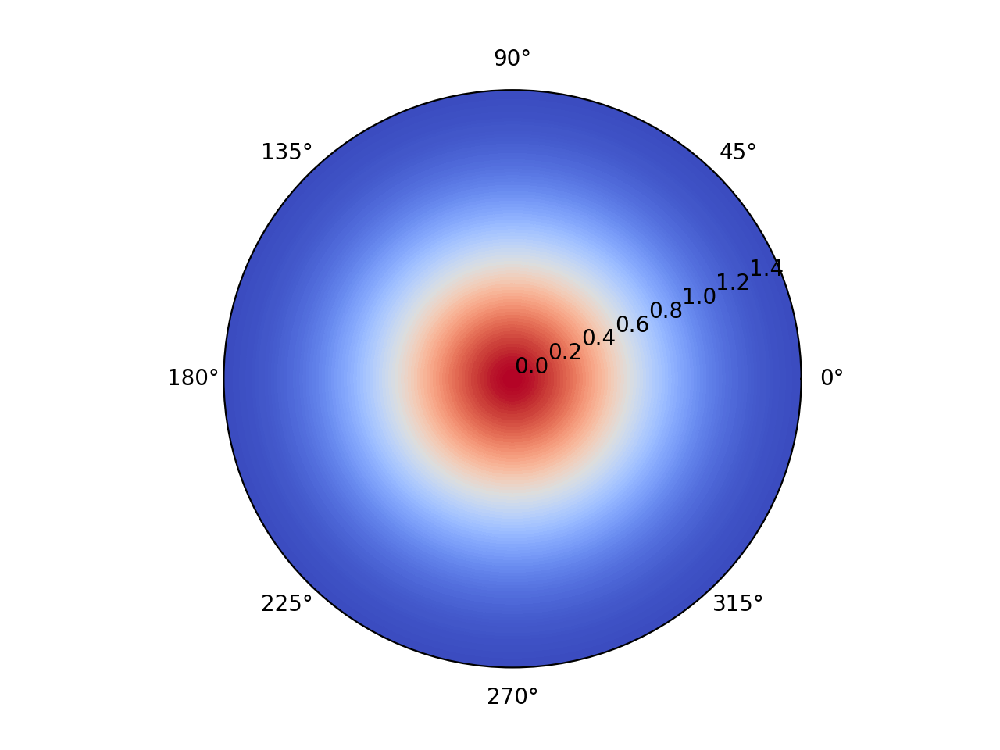

<IPython.core.display.Javascript object>


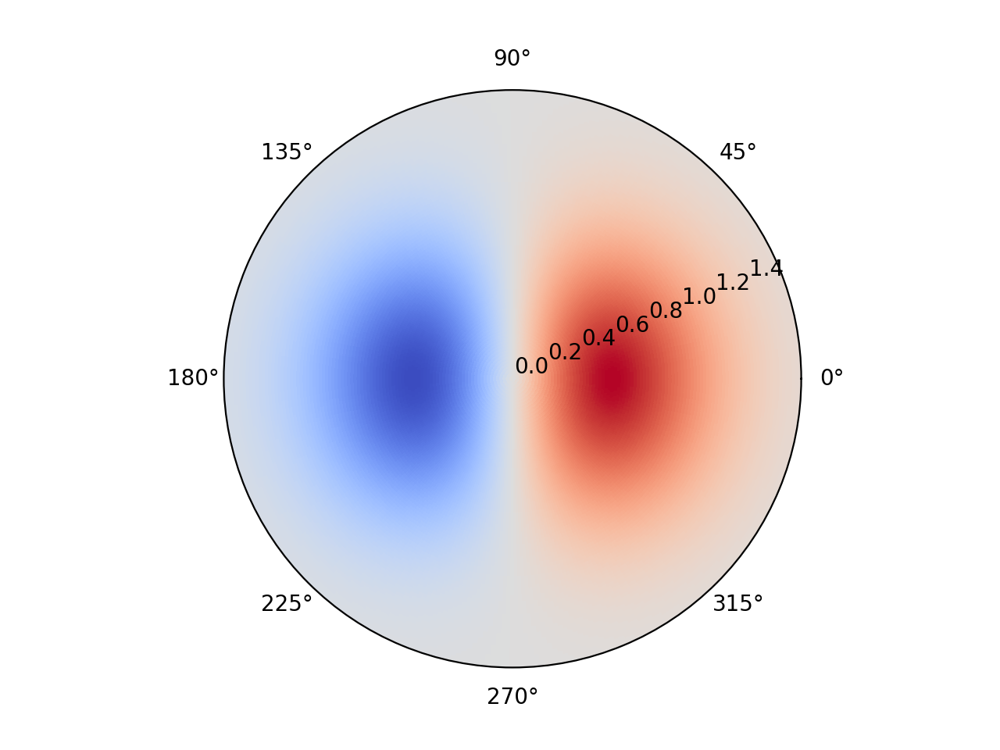

<IPython.core.display.Javascript object>


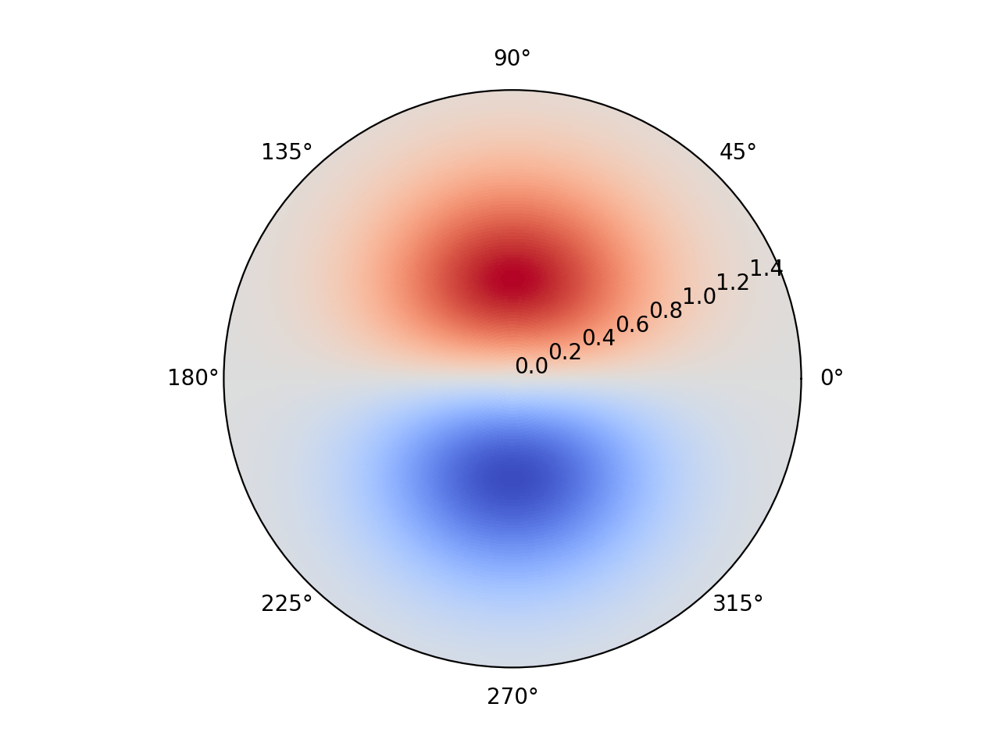

<IPython.core.display.Javascript object>


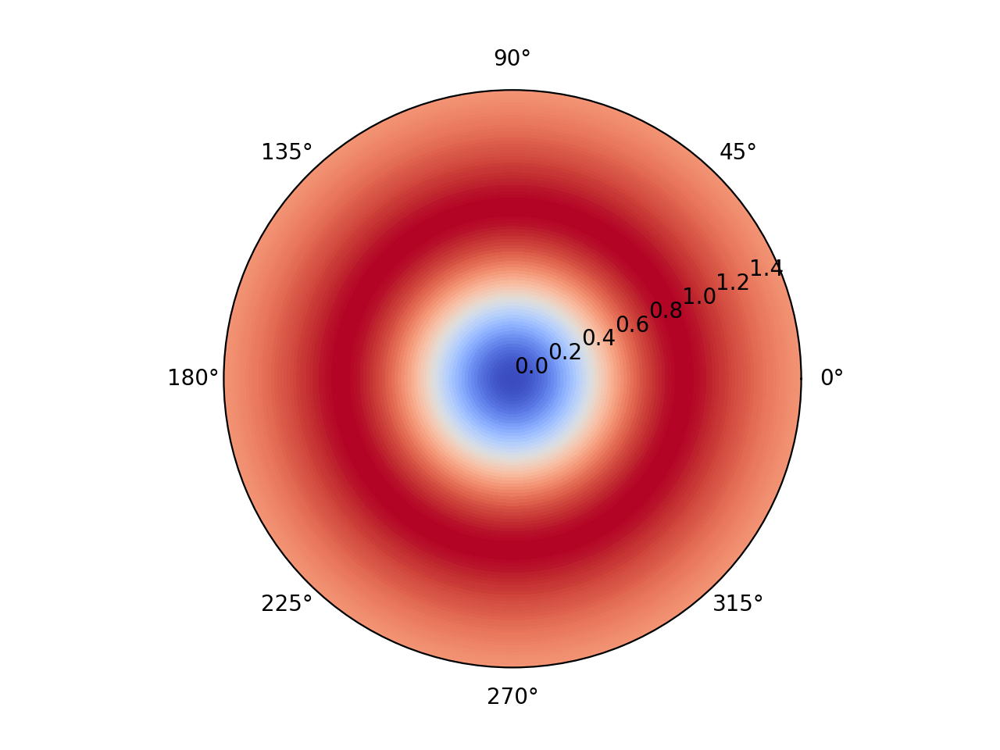

<IPython.core.display.Javascript object>


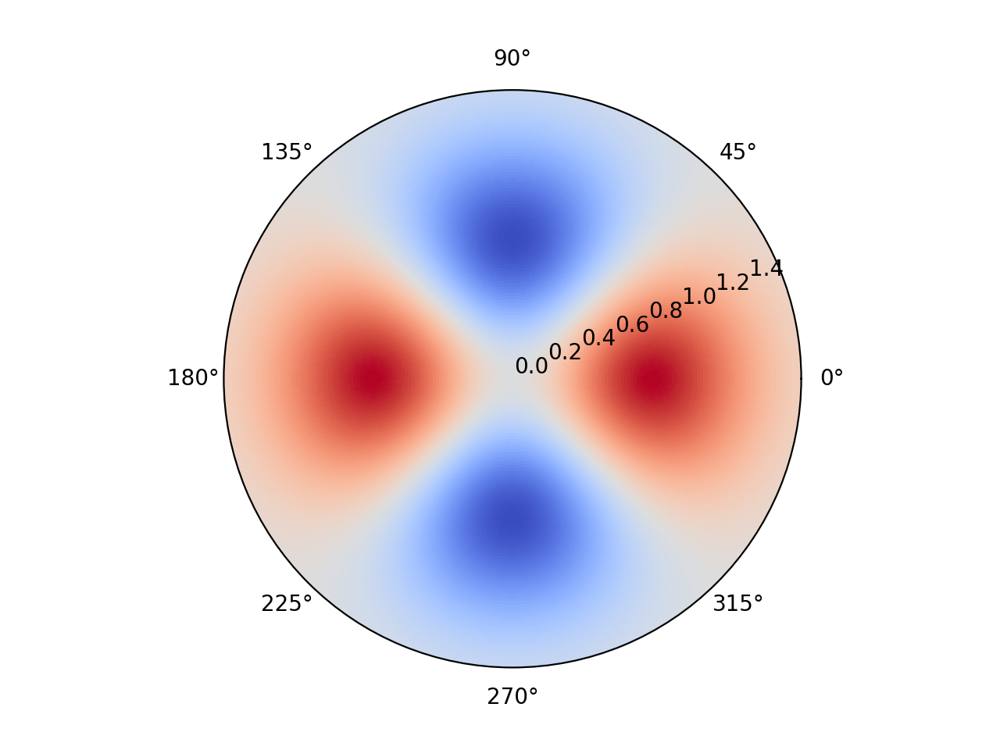

<IPython.core.display.Javascript object>


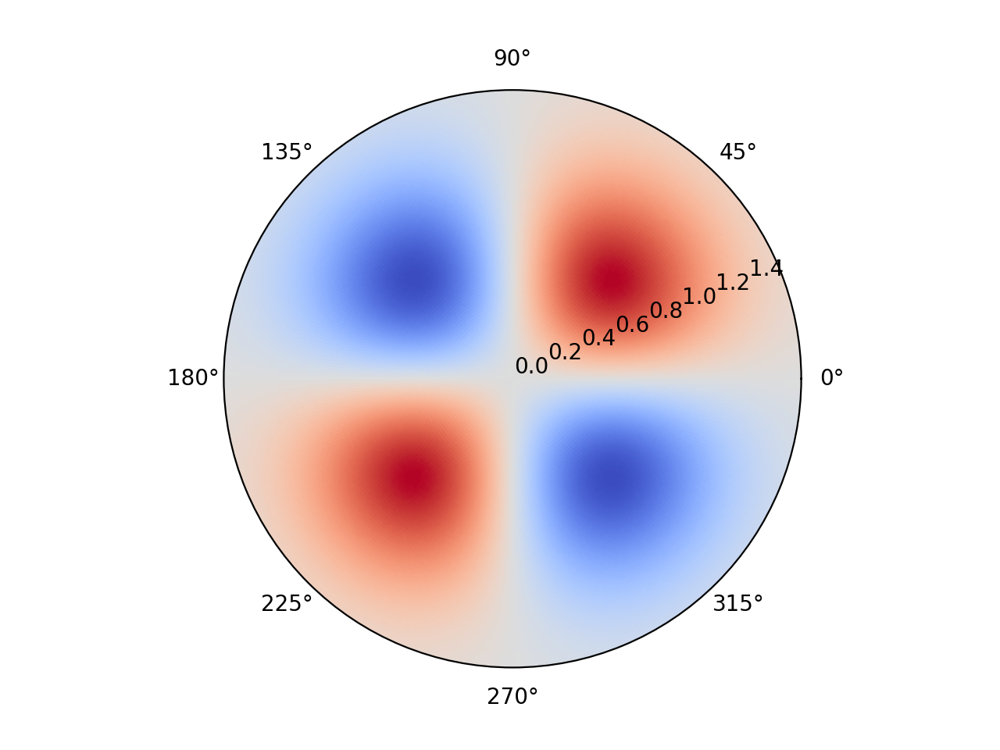

<IPython.core.display.Javascript object>


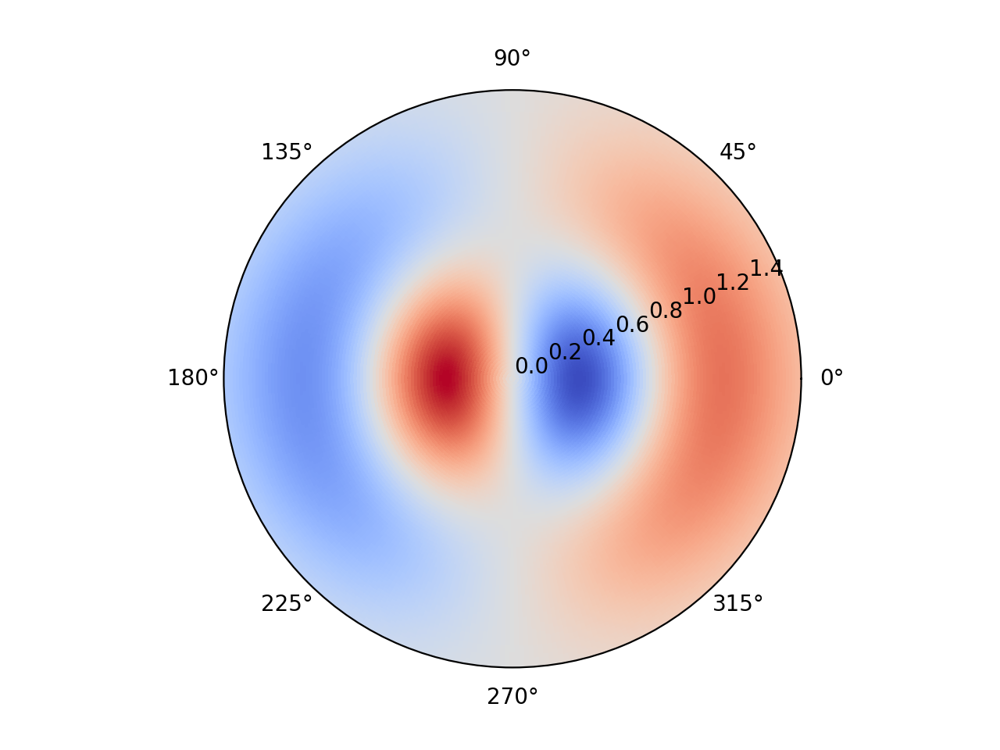

<IPython.core.display.Javascript object>


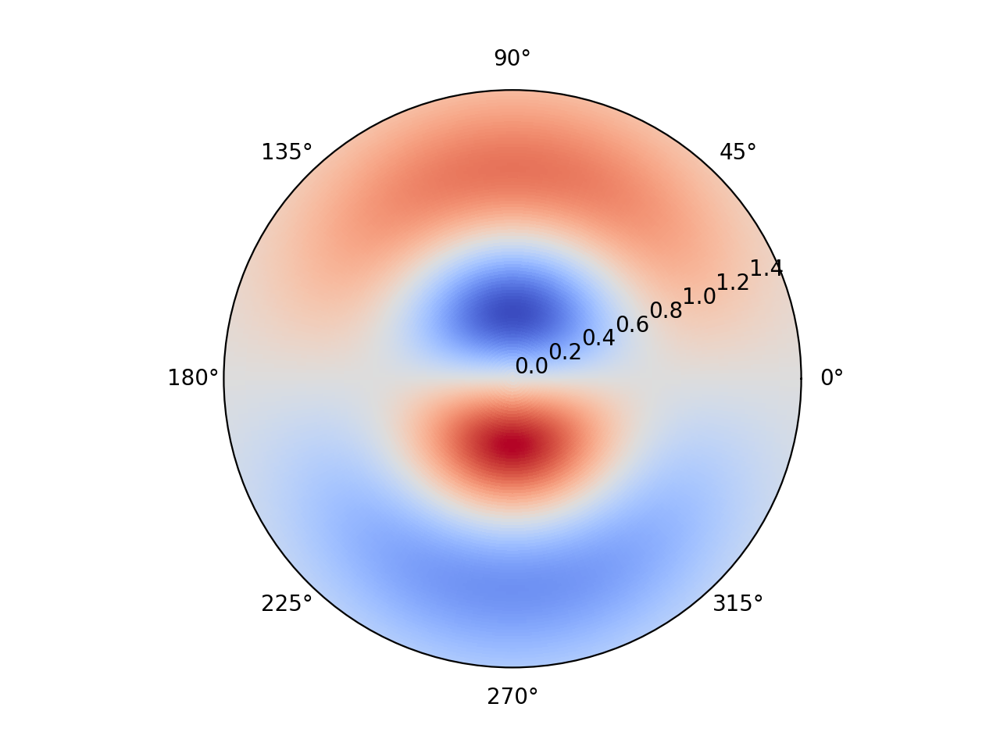

<IPython.core.display.Javascript object>


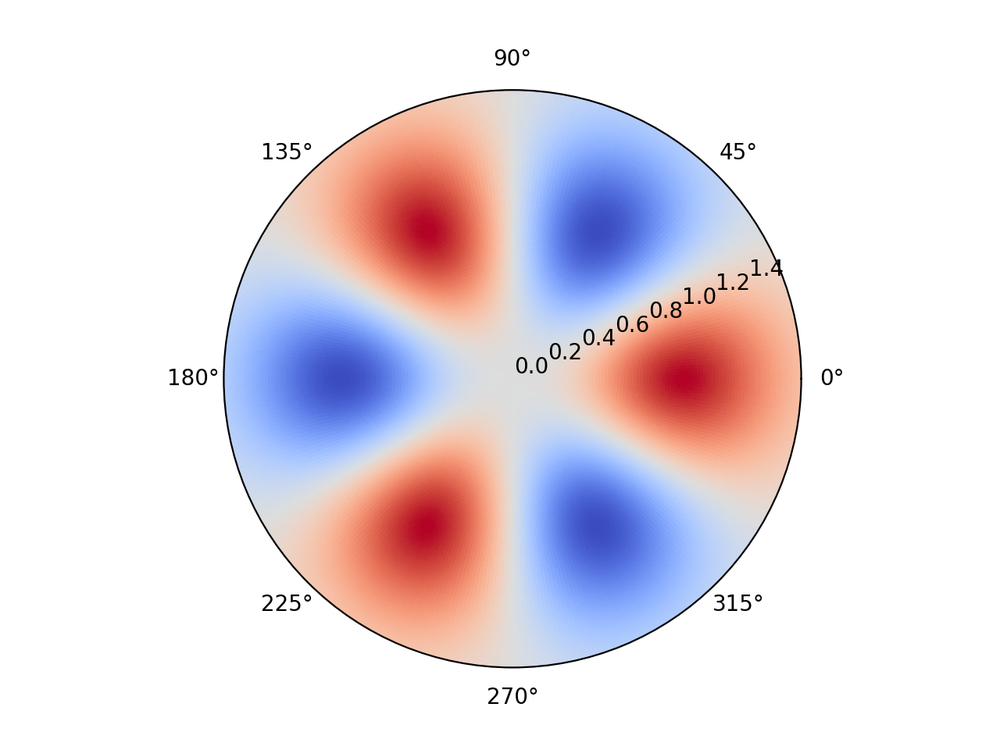

<IPython.core.display.Javascript object>


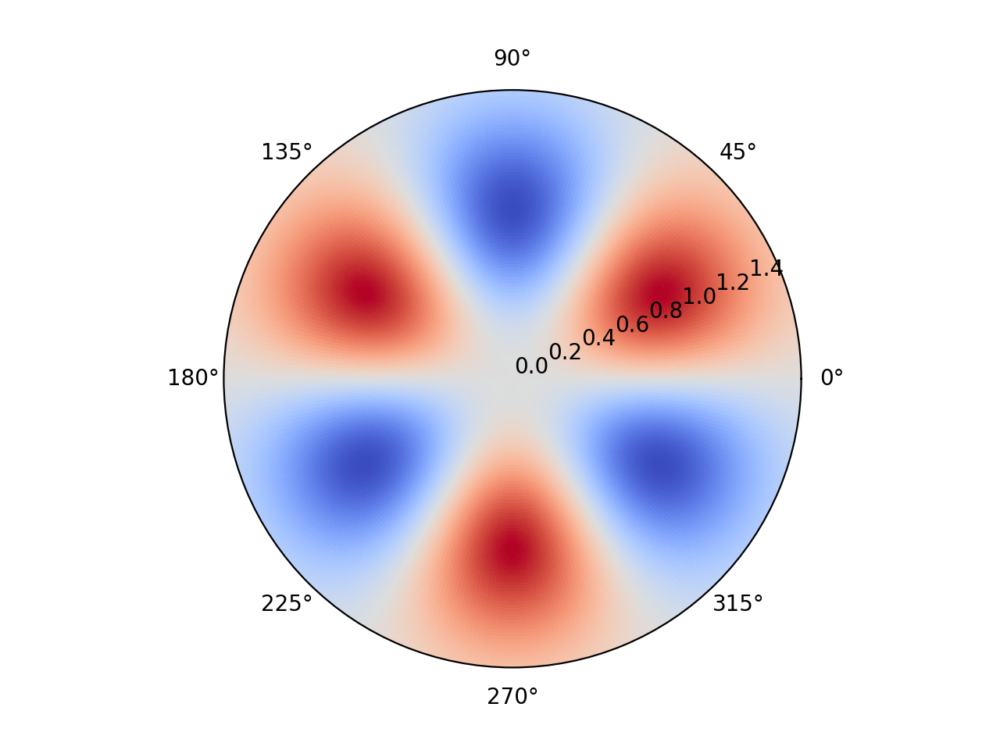

In [271]:
for i in range(10):
    fig, axs = plt.subplots(1, 1, subplot_kw=dict(projection="polar"))
    axs.pcolormesh(phi*np.pi/180,theta*np.pi/180,TDH(3).T[i].T.reshape(360,91),cmap='coolwarm', shading = 'nearest')

<IPython.core.display.Javascript object>


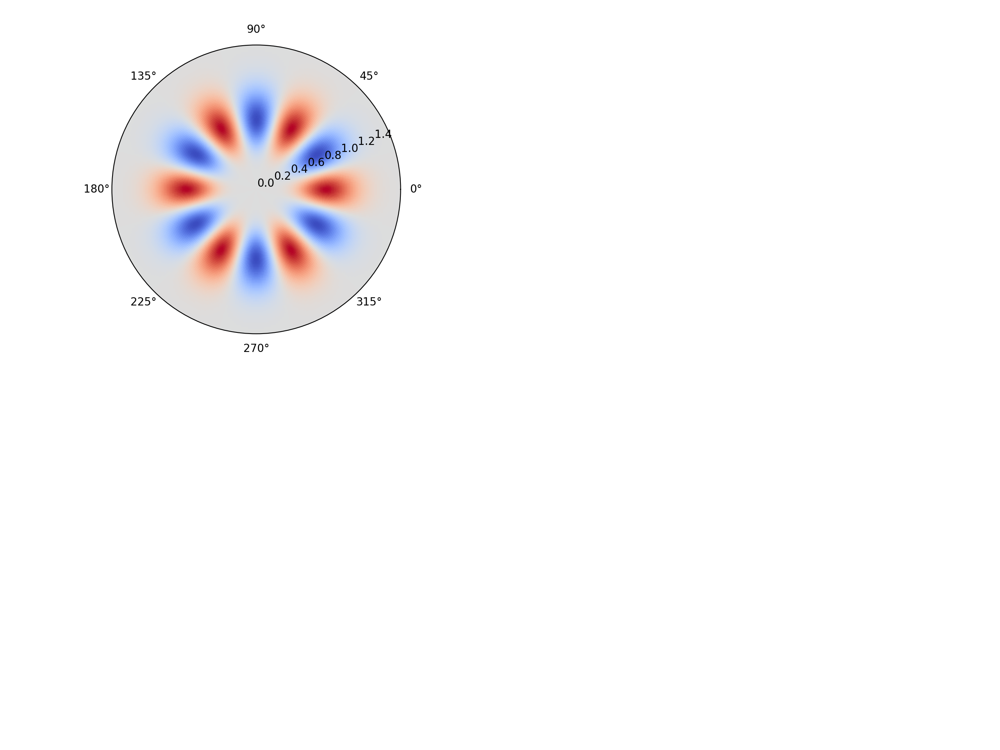

In [62]:
fig, axs = plt.subplots(1, 1, subplot_kw=dict(projection="polar"))
axs.pcolormesh(phi*np.pi/180,theta*np.pi/180,zz60c,cmap='coolwarm', shading = 'nearest')

In [8]:
theta = xx
phi = yy

In [43]:
# 2D Gaussian data fitting using UltraNest
#Which one
def Gaussian2D(A, sigx, sigy):
    return A * np.exp(-(np.sin(theta*np.pi/180)*np.cos(phi*np.pi/180))**2/2/sigx**2 - (np.sin(theta*np.pi/180)*np.sin(phi*np.pi/180))**2/2/sigy**2)

def Gaussian2D(A, sigx, sigy):
    return A * np.exp(-(theta*np.pi/180*np.cos(phi*np.pi/180))**2/2/sigx**2 - (theta*np.pi/180*np.sin(phi*np.pi/180))**2/2/sigy**2) 

# Define model to simulate data
def model1(paras):
    A, sigx, sigy = paras
    return Gaussian2D(A,sigx,sigy).T

sigma = np.std(gain[0])
param_names = ['A', 'sigx', 'sigy']
def my_prior_transform(cube):
    params = cube.copy()

    # transform location parameter: uniform prior
    lo = 0
    hi = 10
    params[0] = cube[0] * (hi - lo) + lo

    lo = 0
    hi = 2
    params[1] = cube[1] * (hi - lo) + lo

    lo = 0
    hi = 2
    params[1] = cube[1] * (hi - lo) + lo
    
    return params
def my_likelihood(params):
    mo = model1(params)
    diff = mo - gain[0]
    return -0.5 * np.sum((diff/sigma)**2)

In [44]:
sampler = ultranest.ReactiveNestedSampler(param_names, my_likelihood, my_prior_transform)
result = sampler.run(min_num_live_points=200)
sampler.print_results()

[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .79 [-185.8417..-185.8417]*| it/evals=4380/8878 eff=50.4725% N=200    0     0 0 0 0 
[ultranest] Likelihood function evaluations: 8914
[ultranest]   logZ = -203.2 +- 0.1573
[ultranest] Effective samples strategy satisfied (ESS = 907.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.11 to 0.50, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.16 tail:0.01 total:0.16 required:<0.50
[ultranest] done iterating.

logZ = -203.186 +- 0.500
  single instance: logZ = -203.186 +- 0.283
  bootstrapped   : logZ = -203.167 +- 0.500
  tail           : logZ = +- 0.010
insert order U test : converged: True correlation: inf iterations

    A                   : 0.5282│ ▁▁▁▁▁▁▁▁▂▃▃▃▄▆▅▆▇▆▆▆▅▄▄▃▃▂▂▁▁▁▁▁ ▁  ▁ │0.5435    0.5353 +- 0.0019
    sigx                : 0.6453│ ▁▁▁▁▁▁▁▁▃▃▄▅▅▆▇▇▇▇▆▆▅▄▃▂▁▁▁▁▁▁▁▁▁   ▁ │0.6823 

In [13]:
ratiog = np.average(result['samples'].T[2])/np.average(result['samples'].T[1])

In [14]:
#Cubicline
theta2 = theta.flatten()
phi2 = phi.flatten()
#obtain ratio from slices
first = gain[100].T[0]
last = gain[100].T[90]
x = np.flip(theta2[:91])
interpo1 = scipy.interpolate.CubicSpline(x,np.flip(first))
interpo2 = scipy.interpolate.CubicSpline(x,np.flip(last))
xnew = np.linspace(0,90,90000)
inter1 = np.flip(interpo1(xnew))
inter2 = np.flip(interpo2(xnew))

def index_nearest(array, value):
    """
    return index of array *nearest* to value

    >>> ix = index_nearest(array, value)

    Arguments
    ---------
    array  (ndarray-like):  array to find index in
    value  (float): value to find index of

    Returns
    -------
    integer for index in array nearest value

    """
    return np.abs(array-value).argmin()

sigy = index_nearest(inter1,np.max(gain[100])/2)
sigx = index_nearest(inter2,np.max(gain[100])/2)
ratioc = sigy/sigx

In [15]:
ratiog,ratioc

(2.6187154670082733, 2.1609935887508906)

In [95]:
#Find all the ratios
totalratiog = []
totalratioc = []
for i in range(len(gain)):
    sigma = np.std(gain[i])
    param_names = ['A', 'sigx', 'sigy']
    def my_prior_transform(cube):
        params = cube.copy()

        # transform location parameter: uniform prior
        lo = 0
        hi = 10
        params[0] = cube[0] * (hi - lo) + lo

        lo = 0
        hi = 2
        params[1] = cube[1] * (hi - lo) + lo

        lo = 0
        hi = 2
        params[1] = cube[1] * (hi - lo) + lo

        return params
    def my_likelihood(params):
        mo = model1(params)
        diff = mo - gain[i]
        return -0.5 * np.sum((diff/sigma)**2)
    sampler = ultranest.ReactiveNestedSampler(param_names, my_likelihood, my_prior_transform)
    result = sampler.run(min_num_live_points=200)
    totalratiog.append(np.average(result['samples'].T[2])/np.average(result['samples'].T[1]))
    first = gain[i].T[0]
    last = gain[i].T[90]
    x = np.flip(theta2[:91])
    interpo1 = scipy.interpolate.CubicSpline(x,np.flip(first))
    interpo2 = scipy.interpolate.CubicSpline(x,np.flip(last))
    xnew = np.linspace(0,90,90000)
    inter1 = np.flip(interpo1(xnew))
    inter2 = np.flip(interpo2(xnew))
    sigy = index_nearest(inter1,np.max(gain[i])/2)
    sigx = index_nearest(inter2,np.max(gain[i])/2)
    ratioc = sigy/sigx
    totalratioc.append(ratioc)

[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-1e+03  147.78 [-1147.8319..-1147.8318]*| it/evals=4590/9597 eff=48.8454% N=200     0 0 0  
[ultranest] Likelihood function evaluations: 9609
[ultranest]   logZ = -1166 +- 0.229
[ultranest] Effective samples strategy satisfied (ESS = 979.5, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.17 to 0.66, need <0.5)
[ultranest]   logZ error budget: single: 0.29 bs:0.23 tail:0.01 total:0.23 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-1e+03  135.13 [-1135.1763..-1135.1761]*| it/evals=4540/9316 eff=49.8025% N=200   0 0 0 0  
[ultranest] Likelihood function evaluations: 9316
[ultranest]   logZ = -1153 +- 0.2533
[ultranest] Effective samples strategy satisfied (ESS = 913.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.21 to 0.61, need <0.5)
[ultranest]   logZ error budget: single: 0.29 bs:0.25 tail:0.01 total:0.25 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-1e+03  122.75 [-1122.7970..-1122.7970]*| it/evals=4590/9646 eff=48.5920% N=200   0 0 0 0  
[ultranest] Likelihood function evaluations: 9649
[ultranest]   logZ = -1141 +- 0.2169
[ultranest] Effective samples strategy satisfied (ESS = 922.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.22, need <0.5)
[ultranest]   logZ error budget: single: 0.29 bs:0.22 tail:0.01 total:0.22 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-1e+03  110.60 [-1110.6556..-1110.6555]*| it/evals=4480/9224 eff=49.6454% N=200   0 0 0 0 
[ultranest] Likelihood function evaluations: 9248
[ultranest]   logZ = -1129 +- 0.2921
[ultranest] Effective samples strategy satisfied (ESS = 906.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.24 to 0.72, need <0.5)
[ultranest]   logZ error budget: single: 0.29 bs:0.29 tail:0.01 total:0.29 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-1e+03  098.67 [-1098.7495..-1098.7494]*| it/evals=4480/9389 eff=48.7539% N=200   0 0 0 0 
[ultranest] Likelihood function evaluations: 9403
[ultranest]   logZ = -1117 +- 0.2269
[ultranest] Effective samples strategy satisfied (ESS = 950.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.12 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.18 to 0.54, need <0.5)
[ultranest]   logZ error budget: single: 0.29 bs:0.23 tail:0.01 total:0.23 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-1e+03  086.96 [-1087.0166..-1087.0166]*| it/evals=4460/9057 eff=50.3557% N=200   0 0 200 
[ultranest] Likelihood function evaluations: 9061
[ultranest]   logZ = -1105 +- 0.1976
[ultranest] Effective samples strategy satisfied (ESS = 983.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.16 to 0.65, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-1e+03  075.44 [-1075.5050..-1075.5049]*| it/evals=4500/9194 eff=50.0334% N=200   0  0 0 
[ultranest] Likelihood function evaluations: 9220
[ultranest]   logZ = -1093 +- 0.2593
[ultranest] Effective samples strategy satisfied (ESS = 966.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.21 to 0.58, need <0.5)
[ultranest]   logZ error budget: single: 0.29 bs:0.26 tail:0.01 total:0.26 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-1e+03  064.12 [-1064.1861..-1064.1861]*| it/evals=4440/9054 eff=50.1468% N=200   0 0 0 0 
[ultranest] Likelihood function evaluations: 9064
[ultranest]   logZ = -1082 +- 0.179
[ultranest] Effective samples strategy satisfied (ESS = 944.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.18, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.18 tail:0.01 total:0.18 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-1e+03  052.99 [-1053.0513..-1053.0513]*| it/evals=4545/9328 eff=49.7918% N=200   0  0 0 
[ultranest] Likelihood function evaluations: 9345
[ultranest]   logZ = -1071 +- 0.2355
[ultranest] Effective samples strategy satisfied (ESS = 975.2, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.13 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.24, need <0.5)
[ultranest]   logZ error budget: single: 0.29 bs:0.24 tail:0.01 total:0.24 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-1e+03  042.03 [-1042.1047..-1042.1041]*| it/evals=4560/9326 eff=49.9671% N=200   0 0  
[ultranest] Likelihood function evaluations: 9351
[ultranest]   logZ = -1060 +- 0.2628
[ultranest] Effective samples strategy satisfied (ESS = 934.7, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.20 to 0.72, need <0.5)
[ultranest]   logZ error budget: single: 0.29 bs:0.26 tail:0.01 total:0.26 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-1e+03  031.24 [-1031.3124..-1031.3123]*| it/evals=4460/9058 eff=50.3500% N=200   0 0  
[ultranest] Likelihood function evaluations: 9062
[ultranest]   logZ = -1049 +- 0.1768
[ultranest] Effective samples strategy satisfied (ESS = 946.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.18, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.18 tail:0.01 total:0.18 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-1e+03  020.64 [-1020.6975..-1020.6974]*| it/evals=4400/8825 eff=51.0145% N=200   0 0  
[ultranest] Likelihood function evaluations: 8826
[ultranest]   logZ = -1038 +- 0.1894
[ultranest] Effective samples strategy satisfied (ESS = 934.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.16 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-1e+03  010.21 [-1010.2639..-1010.2639]*| it/evals=4360/8994 eff=49.5793% N=200   0 0  
[ultranest] Likelihood function evaluations: 9000
[ultranest]   logZ = -1027 +- 0.2079
[ultranest] Effective samples strategy satisfied (ESS = 970.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.15 to 0.64, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-1e+03  9.94 [-999.9946..-999.9945]*| it/evals=4365/8835 eff=50.5501% N=200  0    0 0  
[ultranest] Likelihood function evaluations: 8837
[ultranest]   logZ = -1017 +- 0.2119
[ultranest] Effective samples strategy satisfied (ESS = 941.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.48+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.18 to 0.63, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-1e+03  9.84 [-989.9030..-989.9025]*| it/evals=4440/9169 eff=49.5038% N=200    0  0 0  
[ultranest] Likelihood function evaluations: 9176
[ultranest]   logZ = -1007 +- 0.1758
[ultranest] Effective samples strategy satisfied (ESS = 935.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.14 to 0.51, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.18 tail:0.01 total:0.18 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-1e+03  .91 [-979.9694..-979.9694]*| it/evals=4410/8660 eff=52.1277% N=200     0  0 0  
[ultranest] Likelihood function evaluations: 8661
[ultranest]   logZ = -997.4 +- 0.2308
[ultranest] Effective samples strategy satisfied (ESS = 948.5, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.23, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.23 tail:0.01 total:0.23 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-1e+03  .15 [-970.2106..-970.2105]*| it/evals=4380/8719 eff=51.4145% N=200 0   0  0 0  
[ultranest] Likelihood function evaluations: 8754
[ultranest]   logZ = -987.6 +- 0.2709
[ultranest] Effective samples strategy satisfied (ESS = 968.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.21 to 0.79, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.27 tail:0.01 total:0.27 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-1e+03  .54 [-960.5989..-960.5989]*| it/evals=4420/8926 eff=50.6532% N=200     0  0 0  
[ultranest] Likelihood function evaluations: 8957
[ultranest]   logZ = -978.1 +- 0.1814
[ultranest] Effective samples strategy satisfied (ESS = 934.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.12 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.18, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.18 tail:0.01 total:0.18 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-1e+03  .10 [-951.1514..-951.1514]*| it/evals=4260/8923 eff=48.8364% N=200     0  0 0  
[ultranest] Likelihood function evaluations: 8939
[ultranest]   logZ = -967.9 +- 0.1753
[ultranest] Effective samples strategy satisfied (ESS = 940.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.12 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.18, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.18 tail:0.01 total:0.18 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-9e+02  .82 [-941.8844..-941.8843]*| it/evals=4380/8933 eff=50.1546% N=200    0   0 0  
[ultranest] Likelihood function evaluations: 8952
[ultranest]   logZ = -959.2 +- 0.1711
[ultranest] Effective samples strategy satisfied (ESS = 932.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.17, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.17 tail:0.01 total:0.17 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-9e+02  .69 [-932.7568..-932.7565]*| it/evals=4300/8850 eff=49.7110% N=200     0  0 0  
[ultranest] Likelihood function evaluations: 8870
[ultranest]   logZ = -949.7 +- 0.2065
[ultranest] Effective samples strategy satisfied (ESS = 944.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.07 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.21, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-9e+02  .72 [-923.7789..-923.7787]*| it/evals=4340/8887 eff=49.9597% N=200     0    0  
[ultranest] Likelihood function evaluations: 8894
[ultranest]   logZ = -940.9 +- 0.2372
[ultranest] Effective samples strategy satisfied (ESS = 948.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.19 to 0.55, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.24 tail:0.01 total:0.24 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-9e+02  .91 [-914.9602..-914.9598]*| it/evals=4400/8877 eff=50.7088% N=200     0  0 0  
[ultranest] Likelihood function evaluations: 8890
[ultranest]   logZ = -932.4 +- 0.1836
[ultranest] Effective samples strategy satisfied (ESS = 927.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.14 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.15 to 0.57, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.18 tail:0.01 total:0.18 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-9e+02  .25 [-906.3046..-906.3044]*| it/evals=4300/8821 eff=49.8782% N=200     0  0 0  
[ultranest] Likelihood function evaluations: 8856
[ultranest]   logZ = -923.3 +- 0.2699
[ultranest] Effective samples strategy satisfied (ESS = 924.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.22 to 0.75, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.27 tail:0.01 total:0.27 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-9e+02  .74 [-897.7941..-897.7940]*| it/evals=4300/8652 eff=50.8755% N=200     0  0 0  
[ultranest] Likelihood function evaluations: 8683
[ultranest]   logZ = -914.8 +- 0.2268
[ultranest] Effective samples strategy satisfied (ESS = 937.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.18 to 0.51, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.23 tail:0.01 total:0.23 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-9e+02  .38 [-889.4409..-889.4408]*| it/evals=4400/8971 eff=50.1653% N=200     0  0 0  
[ultranest] Likelihood function evaluations: 8999
[ultranest]   logZ = -906.9 +- 0.2025
[ultranest] Effective samples strategy satisfied (ESS = 934.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-9e+02  .16 [-881.2046..-881.2044]*| it/evals=4280/8583 eff=51.0557% N=200     0  0 0 
[ultranest] Likelihood function evaluations: 8609
[ultranest]   logZ = -898 +- 0.2024
[ultranest] Effective samples strategy satisfied (ESS = 908.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-9e+02  .09 [-873.1529..-873.1529]*| it/evals=4340/8781 eff=50.5769% N=200     0  200  
[ultranest] Likelihood function evaluations: 8818
[ultranest]   logZ = -890.3 +- 0.1913
[ultranest] Effective samples strategy satisfied (ESS = 920.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.14 to 0.52, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-9e+02  .16 [-865.2288..-865.2287]*| it/evals=4320/8800 eff=50.2326% N=200     00 0 0  
[ultranest] Likelihood function evaluations: 8818
[ultranest]   logZ = -882.3 +- 0.2146
[ultranest] Effective samples strategy satisfied (ESS = 906.7, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.19 to 0.51, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-9e+02  .37 [-857.4116..-857.4116]*| it/evals=4300/8783 eff=50.0990% N=200    00  00  
[ultranest] Likelihood function evaluations: 8787
[ultranest]   logZ = -874.3 +- 0.2068
[ultranest] Effective samples strategy satisfied (ESS = 930.2, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.17 to 0.56, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-8e+02  .71 [-849.7592..-849.7591]*| it/evals=4230/8461 eff=51.2045% N=200     0  200 
[ultranest] Likelihood function evaluations: 8474
[ultranest]   logZ = -866.3 +- 0.1855
[ultranest] Effective samples strategy satisfied (ESS = 911.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-8e+02  .18 [-842.2365..-842.2365]*| it/evals=4280/8702 eff=50.3411% N=200    0   00 
[ultranest] Likelihood function evaluations: 8725
[ultranest]   logZ = -859 +- 0.1717
[ultranest] Effective samples strategy satisfied (ESS = 926.5, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.17, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.17 tail:0.01 total:0.17 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-8e+02  .79 [-834.8468..-834.8465]*| it/evals=4300/8531 eff=51.6145% N=200     0  0 0 
[ultranest] Likelihood function evaluations: 8556
[ultranest]   logZ = -851.8 +- 0.1646
[ultranest] Effective samples strategy satisfied (ESS = 975.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.44+-0.07 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.16, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.16 tail:0.01 total:0.16 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-8e+02  .52 [-827.5673..-827.5672]*| it/evals=4280/8648 eff=50.6629% N=200 0   0   0 
[ultranest] Likelihood function evaluations: 8691
[ultranest]   logZ = -844.5 +- 0.2335
[ultranest] Effective samples strategy satisfied (ESS = 934.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.12 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.18 to 0.63, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.23 tail:0.01 total:0.23 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-8e+02  .37 [-820.4166..-820.4162]*| it/evals=4220/8686 eff=49.7290% N=200     0  00 
[ultranest] Likelihood function evaluations: 8690
[ultranest]   logZ = -836.9 +- 0.2386
[ultranest] Effective samples strategy satisfied (ESS = 944.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.20 to 0.56, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.24 tail:0.01 total:0.24 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-8e+02  .34 [-813.3843..-813.3842]*| it/evals=4180/8448 eff=50.6790% N=200         0 
[ultranest] Likelihood function evaluations: 8449
[ultranest]   logZ = -829.7 +- 0.2072
[ultranest] Effective samples strategy satisfied (ESS = 901.7, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.21, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-8e+02  .44 [-806.5004..-806.5003]*| it/evals=4275/8350 eff=52.4540% N=200     0   0 
[ultranest] Likelihood function evaluations: 8353
[ultranest]   logZ = -823.2 +- 0.1954
[ultranest] Effective samples strategy satisfied (ESS = 974.7, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.14 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-8e+02  .65 [-799.7117..-799.7117]*| it/evals=4260/8864 eff=49.1690% N=200    0    0 
[ultranest] Likelihood function evaluations: 8870
[ultranest]   logZ = -816.4 +- 0.2481
[ultranest] Effective samples strategy satisfied (ESS = 936.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.20 to 0.63, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.25 tail:0.01 total:0.25 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-8e+02  .97 [-793.0158..-793.0157]*| it/evals=4320/8719 eff=50.7102% N=200     0   0 
[ultranest] Likelihood function evaluations: 8728
[ultranest]   logZ = -810.1 +- 0.2292
[ultranest] Effective samples strategy satisfied (ESS = 948.2, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.23, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.23 tail:0.01 total:0.23 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-8e+02  .40 [-786.4586..-786.4584]*| it/evals=4260/8612 eff=50.6419% N=200    0  0 0 
[ultranest] Likelihood function evaluations: 8641
[ultranest]   logZ = -803.2 +- 0.2068
[ultranest] Effective samples strategy satisfied (ESS = 945.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.21, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-8e+02  .94 [-779.9834..-779.9833]*| it/evals=4240/8715 eff=49.7945% N=200     0   0 
[ultranest] Likelihood function evaluations: 8733
[ultranest]   logZ = -796.6 +- 0.2037
[ultranest] Effective samples strategy satisfied (ESS = 953.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-8e+02  .58 [-773.6361..-773.6360]*| it/evals=4360/9356 eff=47.6190% N=200  0  0    
[ultranest] Likelihood function evaluations: 9363
[ultranest]   logZ = -790.9 +- 0.2802
[ultranest] Effective samples strategy satisfied (ESS = 951.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.22 to 0.80, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.28 tail:0.01 total:0.28 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-8e+02  .32 [-767.3744..-767.3742]*| it/evals=4240/8577 eff=50.6148% N=200     0  0 
[ultranest] Likelihood function evaluations: 8600
[ultranest]   logZ = -784 +- 0.1912
[ultranest] Effective samples strategy satisfied (ESS = 936.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-8e+02  .17 [-761.2221..-761.2221]*| it/evals=4100/8558 eff=49.0548% N=200    0   
[ultranest] Likelihood function evaluations: 8558
[ultranest]   logZ = -777.1 +- 0.1305
[ultranest] Effective samples strategy satisfied (ESS = 950.7, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.13, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.13 tail:0.01 total:0.13 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-8e+02  .11 [-755.1594..-755.1593]*| it/evals=4280/9122 eff=47.9713% N=200    0    
[ultranest] Likelihood function evaluations: 9125
[ultranest]   logZ = -772 +- 0.2823
[ultranest] Effective samples strategy satisfied (ESS = 956.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.23 to 0.56, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.28 tail:0.01 total:0.28 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-7e+02  .14 [-749.1911..-749.1911]*| it/evals=4185/8454 eff=50.7027% N=200     0   
[ultranest] Likelihood function evaluations: 8460
[ultranest]   logZ = -765.6 +- 0.2224
[ultranest] Effective samples strategy satisfied (ESS = 928.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.19 to 0.65, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.22 tail:0.01 total:0.22 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-7e+02  .27 [-743.3338..-743.3336]*| it/evals=4200/8628 eff=49.8339% N=200 0  0   
[ultranest] Likelihood function evaluations: 8658
[ultranest]   logZ = -759.8 +- 0.2022
[ultranest] Effective samples strategy satisfied (ESS = 929.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-7e+02  .49 [-737.5605..-737.5599]*| it/evals=4230/8791 eff=49.2376% N=200 0  00   
[ultranest] Likelihood function evaluations: 8799
[ultranest]   logZ = -754.1 +- 0.1763
[ultranest] Effective samples strategy satisfied (ESS = 953.5, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.18, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.18 tail:0.01 total:0.18 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-7e+02  .80 [-731.8638..-731.8634]*| it/evals=4160/8693 eff=48.9815% N=200     00  
[ultranest] Likelihood function evaluations: 8716
[ultranest]   logZ = -748.1 +- 0.1936
[ultranest] Effective samples strategy satisfied (ESS = 972.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-7e+02  .20 [-726.2630..-726.2626]*| it/evals=4100/8294 eff=50.6548% N=200    0  0 
[ultranest] Likelihood function evaluations: 8310
[ultranest]   logZ = -742.2 +- 0.1911
[ultranest] Effective samples strategy satisfied (ESS = 923.7, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.12 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.16 to 0.50, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-7e+02  .67 [-720.7332..-720.7331]*| it/evals=4140/8409 eff=50.4325% N=200     0   
[ultranest] Likelihood function evaluations: 8412
[ultranest]   logZ = -736.8 +- 0.2415
[ultranest] Effective samples strategy satisfied (ESS = 952.2, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.19 to 0.85, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.24 tail:0.01 total:0.24 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-7e+02  .24 [-715.3013..-715.3009]*| it/evals=4185/8505 eff=50.3913% N=200     0   
[ultranest] Likelihood function evaluations: 8526
[ultranest]   logZ = -731.6 +- 0.1651
[ultranest] Effective samples strategy satisfied (ESS = 948.2, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.17, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.17 tail:0.01 total:0.17 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-7e+02  .89 [-709.9573..-709.9572]*| it/evals=4200/8489 eff=50.6696% N=200 0       
[ultranest] Likelihood function evaluations: 8498
[ultranest]   logZ = -726.3 +- 0.1906
[ultranest] Effective samples strategy satisfied (ESS = 966.2, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-7e+02  .61 [-704.6699..-704.6699]*| it/evals=4120/8458 eff=49.8910% N=200     0   
[ultranest] Likelihood function evaluations: 8490
[ultranest]   logZ = -720.7 +- 0.2298
[ultranest] Effective samples strategy satisfied (ESS = 944.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.23, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.23 tail:0.01 total:0.23 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-7e+02  .42 [-699.4888..-699.4882]*| it/evals=4200/8333 eff=51.6415% N=200    00   
[ultranest] Likelihood function evaluations: 8350
[ultranest]   logZ = -716 +- 0.2089
[ultranest] Effective samples strategy satisfied (ESS = 953.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.16 to 0.73, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-7e+02  .30 [-694.3634..-694.3632]*| it/evals=4140/8520 eff=49.7596% N=200    0    
[ultranest] Likelihood function evaluations: 8525
[ultranest]   logZ = -710.5 +- 0.2008
[ultranest] Effective samples strategy satisfied (ESS = 937.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-7e+02  .27 [-689.3316..-689.3314]*| it/evals=4200/8637 eff=49.7807% N=200    0    
[ultranest] Likelihood function evaluations: 8671
[ultranest]   logZ = -705.8 +- 0.1639
[ultranest] Effective samples strategy satisfied (ESS = 962.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.07 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.16, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.16 tail:0.01 total:0.16 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-7e+02  .30 [-684.3607..-684.3604]*| it/evals=4185/8565 eff=50.0299% N=200     0   
[ultranest] Likelihood function evaluations: 8597
[ultranest]   logZ = -700.7 +- 0.2542
[ultranest] Effective samples strategy satisfied (ESS = 941.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.21 to 0.55, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.25 tail:0.01 total:0.25 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-7e+02  .41 [-679.4661..-679.4656]*| it/evals=4120/8429 eff=50.0668% N=200 0  0    
[ultranest] Likelihood function evaluations: 8429
[ultranest]   logZ = -695.4 +- 0.2049
[ultranest] Effective samples strategy satisfied (ESS = 946.5, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.21, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.20 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-7e+02  .60 [-674.6575..-674.6574]*| it/evals=4280/9017 eff=48.5426% N=200    0    
[ultranest] Likelihood function evaluations: 9027
[ultranest]   logZ = -691.5 +- 0.1621
[ultranest] Effective samples strategy satisfied (ESS = 970.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.12 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.16, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.16 tail:0.01 total:0.16 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-7e+02  .86 [-669.9169..-669.9165]*| it/evals=4180/8638 eff=49.5378% N=200    0    
[ultranest] Likelihood function evaluations: 8671
[ultranest]   logZ = -686.2 +- 0.253
[ultranest] Effective samples strategy satisfied (ESS = 938.7, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.20 to 0.59, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.25 tail:0.01 total:0.25 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-7e+02  .19 [-665.2411..-665.2409]*| it/evals=4140/8333 eff=50.9037% N=200    0    
[ultranest] Likelihood function evaluations: 8350
[ultranest]   logZ = -681.4 +- 0.1982
[ultranest] Effective samples strategy satisfied (ESS = 962.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-7e+02  .59 [-660.6456..-660.6456]*| it/evals=4180/8886 eff=48.1234% N=200    200  
[ultranest] Likelihood function evaluations: 8888
[ultranest]   logZ = -677 +- 0.1792
[ultranest] Effective samples strategy satisfied (ESS = 942.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.18, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.18 tail:0.01 total:0.18 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-7e+02  .06 [-656.1122..-656.1122]*| it/evals=4120/8470 eff=49.8186% N=200  0 0    
[ultranest] Likelihood function evaluations: 8488
[ultranest]   logZ = -672.1 +- 0.2094
[ultranest] Effective samples strategy satisfied (ESS = 946.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.43+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.21, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-7e+02  .60 [-651.6645..-651.6645]*| it/evals=4160/8400 eff=50.7317% N=200     0   
[ultranest] Likelihood function evaluations: 8429
[ultranest]   logZ = -667.9 +- 0.1764
[ultranest] Effective samples strategy satisfied (ESS = 931.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.18, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.18 tail:0.01 total:0.18 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-6e+02  .21 [-647.2747..-647.2742]*| it/evals=4100/8351 eff=50.3006% N=200 0  0    
[ultranest] Likelihood function evaluations: 8351
[ultranest]   logZ = -663.2 +- 0.1726
[ultranest] Effective samples strategy satisfied (ESS = 929.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.17, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.17 tail:0.01 total:0.17 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-6e+02  .89 [-642.9352..-642.9349]*| it/evals=4080/8248 eff=50.6958% N=200    0    
[ultranest] Likelihood function evaluations: 8249
[ultranest]   logZ = -658.7 +- 0.2113
[ultranest] Effective samples strategy satisfied (ESS = 920.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.17 to 0.55, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-6e+02  .63 [-638.6938..-638.6936]*| it/evals=4240/8681 eff=49.9941% N=200    0   
[ultranest] Likelihood function evaluations: 8710
[ultranest]   logZ = -655.3 +- 0.1921
[ultranest] Effective samples strategy satisfied (ESS = 969.2, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.15 to 0.58, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-6e+02  .45 [-634.5098..-634.5097]*| it/evals=4160/8359 eff=50.9866% N=200     0   
[ultranest] Likelihood function evaluations: 8372
[ultranest]   logZ = -650.7 +- 0.1708
[ultranest] Effective samples strategy satisfied (ESS = 916.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.06 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.17, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.17 tail:0.01 total:0.17 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-6e+02  .32 [-630.3780..-630.3775]*| it/evals=4120/8407 eff=50.2010% N=200    0   
[ultranest] Likelihood function evaluations: 8410
[ultranest]   logZ = -646.3 +- 0.159
[ultranest] Effective samples strategy satisfied (ESS = 913.5, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.16, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.16 tail:0.01 total:0.16 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-6e+02  .26 [-626.3129..-626.3128]*| it/evals=4140/8326 eff=50.9476% N=200    0   
[ultranest] Likelihood function evaluations: 8326
[ultranest]   logZ = -642.4 +- 0.1953
[ultranest] Effective samples strategy satisfied (ESS = 950.2, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-6e+02  .27 [-622.3264..-622.3263]*| it/evals=4120/8846 eff=47.6521% N=200    0    
[ultranest] Likelihood function evaluations: 8852
[ultranest]   logZ = -638.3 +- 0.1871
[ultranest] Effective samples strategy satisfied (ESS = 946.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.12 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-6e+02  .34 [-618.3960..-618.3960]*| it/evals=4120/8578 eff=49.1764% N=200    0    
[ultranest] Likelihood function evaluations: 8586
[ultranest]   logZ = -634.4 +- 0.1968
[ultranest] Effective samples strategy satisfied (ESS = 934.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.13 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-6e+02  .47 [-614.5343..-614.5341]*| it/evals=4120/8141 eff=51.8826% N=200    0    
[ultranest] Likelihood function evaluations: 8165
[ultranest]   logZ = -630.6 +- 0.2035
[ultranest] Effective samples strategy satisfied (ESS = 911.2, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-6e+02  .66 [-610.7161..-610.7161]*| it/evals=4060/8159 eff=51.0114% N=200    0    
[ultranest] Likelihood function evaluations: 8173
[ultranest]   logZ = -626.5 +- 0.1203
[ultranest] Effective samples strategy satisfied (ESS = 944.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.44+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.12, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.12 tail:0.01 total:0.12 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-6e+02  .92 [-606.9806..-606.9802]*| it/evals=4140/8489 eff=49.9457% N=200    0    
[ultranest] Likelihood function evaluations: 8517
[ultranest]   logZ = -623.1 +- 0.1783
[ultranest] Effective samples strategy satisfied (ESS = 953.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.07 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.18, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.18 tail:0.01 total:0.18 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-6e+02  .23 [-603.2861..-603.2858]*| it/evals=4040/8259 eff=50.1303% N=200 0  00   
[ultranest] Likelihood function evaluations: 8263
[ultranest]   logZ = -618.9 +- 0.2332
[ultranest] Effective samples strategy satisfied (ESS = 956.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.20 to 0.53, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.23 tail:0.01 total:0.23 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-6e+02  .60 [-599.6625..-599.6621]*| it/evals=4050/8348 eff=49.7054% N=200 0      
[ultranest] Likelihood function evaluations: 8359
[ultranest]   logZ = -615.3 +- 0.1645
[ultranest] Effective samples strategy satisfied (ESS = 913.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.16, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.16 tail:0.01 total:0.16 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-6e+02  .03 [-596.0888..-596.0887]*| it/evals=4095/8409 eff=49.8843% N=200         
[ultranest] Likelihood function evaluations: 8414
[ultranest]   logZ = -611.9 +- 0.1849
[ultranest] Effective samples strategy satisfied (ESS = 909.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.48+-0.12 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.18 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-6e+02  .53 [-592.5823..-592.5822]*| it/evals=4160/8468 eff=50.3145% N=200 0  0    
[ultranest] Likelihood function evaluations: 8494
[ultranest]   logZ = -608.9 +- 0.1564
[ultranest] Effective samples strategy satisfied (ESS = 968.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.16, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.16 tail:0.01 total:0.16 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-6e+02  .07 [-589.1322..-589.1321]*| it/evals=4200/8833 eff=48.6505% N=200 0  0    
[ultranest] Likelihood function evaluations: 8865
[ultranest]   logZ = -605.6 +- 0.2762
[ultranest] Effective samples strategy satisfied (ESS = 957.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.24 to 0.51, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.28 tail:0.01 total:0.28 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-6e+02  .68 [-585.7310..-585.7309]*| it/evals=4140/8486 eff=49.9638% N=200        
[ultranest] Likelihood function evaluations: 8525
[ultranest]   logZ = -601.9 +- 0.2241
[ultranest] Effective samples strategy satisfied (ESS = 936.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.17 to 0.55, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.22 tail:0.01 total:0.22 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-6e+02  .34 [-582.4013..-582.4011]*| it/evals=4005/8122 eff=50.5554% N=200    0    
[ultranest] Likelihood function evaluations: 8125
[ultranest]   logZ = -597.9 +- 0.2126
[ultranest] Effective samples strategy satisfied (ESS = 939.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.17 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.21, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-6e+02  .07 [-579.1335..-579.1335]*| it/evals=4160/8757 eff=48.6152% N=200    00   
[ultranest] Likelihood function evaluations: 8796
[ultranest]   logZ = -595.4 +- 0.186
[ultranest] Effective samples strategy satisfied (ESS = 963.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-6e+02  .84 [-575.9082..-575.9082]*| it/evals=4020/8217 eff=50.1434% N=200     0   
[ultranest] Likelihood function evaluations: 8256
[ultranest]   logZ = -591.5 +- 0.1898
[ultranest] Effective samples strategy satisfied (ESS = 944.7, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.14 to 0.58, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-6e+02  .68 [-572.7484..-572.7483]*| it/evals=4080/8215 eff=50.9046% N=200    0   
[ultranest] Likelihood function evaluations: 8245
[ultranest]   logZ = -588.5 +- 0.1903
[ultranest] Effective samples strategy satisfied (ESS = 946.2, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-6e+02  .59 [-569.6465..-569.6465]*| it/evals=4020/8247 eff=49.9565% N=200    0   
[ultranest] Likelihood function evaluations: 8276
[ultranest]   logZ = -585.2 +- 0.1771
[ultranest] Effective samples strategy satisfied (ESS = 915.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.18, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.18 tail:0.01 total:0.18 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-6e+02  .56 [-566.6171..-566.6170]*| it/evals=4040/8387 eff=49.3465% N=200    0   
[ultranest] Likelihood function evaluations: 8423
[ultranest]   logZ = -582.3 +- 0.1781
[ultranest] Effective samples strategy satisfied (ESS = 920.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.18, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.18 tail:0.01 total:0.18 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-6e+02  .61 [-563.6643..-563.6643]*| it/evals=4020/8002 eff=51.5252% N=200 0  0   
[ultranest] Likelihood function evaluations: 8025
[ultranest]   logZ = -579.2 +- 0.2239
[ultranest] Effective samples strategy satisfied (ESS = 945.2, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.18 to 0.60, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.22 tail:0.01 total:0.22 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-6e+02  .73 [-560.7878..-560.7877]*| it/evals=4120/8495 eff=49.6685% N=200 0  0  
[ultranest] Likelihood function evaluations: 8498
[ultranest]   logZ = -576.8 +- 0.17
[ultranest] Effective samples strategy satisfied (ESS = 926.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.14 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.17, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.17 tail:0.01 total:0.17 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-6e+02  .95 [-558.0149..-558.0146]*| it/evals=4080/8372 eff=49.9266% N=200    0  
[ultranest] Likelihood function evaluations: 8387
[ultranest]   logZ = -573.8 +- 0.2065
[ultranest] Effective samples strategy satisfied (ESS = 912.5, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.12 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.15 to 0.66, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-6e+02  .27 [-555.3298..-555.3297]*| it/evals=4120/8341 eff=50.6080% N=200 0  0   
[ultranest] Likelihood function evaluations: 8371
[ultranest]   logZ = -571.4 +- 0.1768
[ultranest] Effective samples strategy satisfied (ESS = 957.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.13 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.14 to 0.56, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.18 tail:0.01 total:0.18 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-6e+02  .71 [-552.7722..-552.7720]*| it/evals=4040/8203 eff=50.4811% N=200 0      
[ultranest] Likelihood function evaluations: 8213
[ultranest]   logZ = -568.4 +- 0.1925
[ultranest] Effective samples strategy satisfied (ESS = 910.7, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.17 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-6e+02  .29 [-550.3462..-550.3456]*| it/evals=4120/8453 eff=49.9212% N=200    0  
[ultranest] Likelihood function evaluations: 8455
[ultranest]   logZ = -566.3 +- 0.1941
[ultranest] Effective samples strategy satisfied (ESS = 938.5, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.17 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-5e+02  .04 [-548.0998..-548.0998]*| it/evals=3980/8072 eff=50.5589% N=200    0  
[ultranest] Likelihood function evaluations: 8102
[ultranest]   logZ = -563.4 +- 0.1845
[ultranest] Effective samples strategy satisfied (ESS = 972.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.18, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.18 tail:0.01 total:0.18 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-5e+02  .98 [-546.0332..-546.0332]*| it/evals=4100/8587 eff=48.8852% N=200    0   
[ultranest] Likelihood function evaluations: 8594
[ultranest]   logZ = -562 +- 0.1932
[ultranest] Effective samples strategy satisfied (ESS = 950.5, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.06 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-5e+02  .17 [-544.2352..-544.2347]*| it/evals=3920/8035 eff=50.0319% N=200 0  0   
[ultranest] Likelihood function evaluations: 8052
[ultranest]   logZ = -559.3 +- 0.1721
[ultranest] Effective samples strategy satisfied (ESS = 910.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.14 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.17, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.17 tail:0.01 total:0.17 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-5e+02  .65 [-542.7009..-542.7008]*| it/evals=4000/8483 eff=48.2917% N=200 0      
[ultranest] Likelihood function evaluations: 8508
[ultranest]   logZ = -558.1 +- 0.2119
[ultranest] Effective samples strategy satisfied (ESS = 991.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.21, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-5e+02  .48 [-541.5407..-541.5404]*| it/evals=4095/8425 eff=49.7872% N=200 0  00 
[ultranest] Likelihood function evaluations: 8425
[ultranest]   logZ = -557.4 +- 0.1274
[ultranest] Effective samples strategy satisfied (ESS = 957.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.13, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.13 tail:0.01 total:0.13 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-5e+02  .75 [-540.8023..-540.8015]*| it/evals=4060/8264 eff=50.3472% N=200 0  0  
[ultranest] Likelihood function evaluations: 8264
[ultranest]   logZ = -556.4 +- 0.1942
[ultranest] Effective samples strategy satisfied (ESS = 918.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-5e+02  .54 [-540.6014..-540.6012]*| it/evals=3920/7989 eff=50.3274% N=200 0  0   
[ultranest] Likelihood function evaluations: 8011
[ultranest]   logZ = -555.6 +- 0.1951
[ultranest] Effective samples strategy satisfied (ESS = 893.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.14 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.14 to 0.56, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.


In [392]:
totalratiogori = []
for i in range(len(gain)):
    sigma = np.std(gain[i])
    param_names = ['A', 'sigx', 'sigy']
    def my_prior_transform(cube):
        params = cube.copy()

        # transform location parameter: uniform prior
        lo = 0
        hi = 10
        params[0] = cube[0] * (hi - lo) + lo

        lo = 0
        hi = 2
        params[1] = cube[1] * (hi - lo) + lo

        lo = 0
        hi = 2
        params[1] = cube[1] * (hi - lo) + lo

        return params
    def my_likelihood(params):
        mo = model1(params)
        diff = mo - gain[i]
        return -0.5 * np.sum((diff/sigma)**2)
    sampler = ultranest.ReactiveNestedSampler(param_names, my_likelihood, my_prior_transform)
    result = sampler.run(min_num_live_points=200)
    totalratiogori.append(np.average(result['samples'].T[2])/np.average(result['samples'].T[1]))

[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .78 [-185.8529..-185.8527]*| it/evals=4500/8758 eff=52.5824% N=200 0  0   0 0 0 0  
[ultranest] Likelihood function evaluations: 8766
[ultranest]   logZ = -203.8 +- 0.1724
[ultranest] Effective samples strategy satisfied (ESS = 974.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.15 to 0.50, need <0.5)
[ultranest]   logZ error budget: single: 0.29 bs:0.17 tail:0.01 total:0.17 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .24 [-184.2995..-184.2994]*| it/evals=4340/8658 eff=51.3124% N=200 0        0 0 0  
[ultranest] Likelihood function evaluations: 8659
[ultranest]   logZ = -201.4 +- 0.2342
[ultranest] Effective samples strategy satisfied (ESS = 944.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.23, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.23 tail:0.01 total:0.23 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .82 [-182.8764..-182.8763]*| it/evals=4365/8543 eff=52.3193% N=200    0   0 0 0 0 
[ultranest] Likelihood function evaluations: 8557
[ultranest]   logZ = -200.1 +- 0.1696
[ultranest] Effective samples strategy satisfied (ESS = 953.5, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.13 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.14 to 0.50, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.17 tail:0.01 total:0.17 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .51 [-181.5656..-181.5654]*| it/evals=4340/8502 eff=52.2766% N=200 0  00  0 0 0 0 
[ultranest] Likelihood function evaluations: 8539
[ultranest]   logZ = -198.7 +- 0.2193
[ultranest] Effective samples strategy satisfied (ESS = 937.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.13 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.22, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.22 tail:0.01 total:0.22 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .29 [-180.3473..-180.3468]*| it/evals=4280/8785 eff=49.8544% N=200 0  0   0 0 0 0 
[ultranest] Likelihood function evaluations: 8802
[ultranest]   logZ = -197.2 +- 0.2704
[ultranest] Effective samples strategy satisfied (ESS = 912.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.15 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.27, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.27 tail:0.01 total:0.27 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .16 [-179.2106..-179.2103]*| it/evals=4340/8724 eff=50.9151% N=200  0 0 0 0 0 0 0 
[ultranest] Likelihood function evaluations: 8741
[ultranest]   logZ = -196.3 +- 0.1369
[ultranest] Effective samples strategy satisfied (ESS = 897.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.14, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.14 tail:0.01 total:0.14 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .10 [-178.1568..-178.1565]*| it/evals=4420/8856 eff=51.0628% N=200    0  0   00  
[ultranest] Likelihood function evaluations: 8889
[ultranest]   logZ = -195.8 +- 0.1757
[ultranest] Effective samples strategy satisfied (ESS = 979.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.12 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.18, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.18 tail:0.01 total:0.18 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .12 [-177.1832..-177.1832]*| it/evals=4340/8399 eff=52.9333% N=200    0  00 0 00 
[ultranest] Likelihood function evaluations: 8411
[ultranest]   logZ = -194.2 +- 0.1904
[ultranest] Effective samples strategy satisfied (ESS = 885.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .20 [-176.2568..-176.2567]*| it/evals=4380/8639 eff=51.9019% N=200 0  0   0  0 0 
[ultranest] Likelihood function evaluations: 8645
[ultranest]   logZ = -193.6 +- 0.2107
[ultranest] Effective samples strategy satisfied (ESS = 912.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.17 to 0.52, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .35 [-175.4018..-175.4017]*| it/evals=4200/8272 eff=52.0317% N=200 0  0   0   0 
[ultranest] Likelihood function evaluations: 8307
[ultranest]   logZ = -191.8 +- 0.2402
[ultranest] Effective samples strategy satisfied (ESS = 945.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.07 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.18 to 0.66, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.24 tail:0.01 total:0.24 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .55 [-174.6094..-174.6091]*| it/evals=4365/8670 eff=51.5348% N=200 0  0  0    
[ultranest] Likelihood function evaluations: 8678
[ultranest]   logZ = -191.8 +- 0.2102
[ultranest] Effective samples strategy satisfied (ESS = 935.2, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.07 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.15 to 0.61, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .80 [-173.8536..-173.8534]*| it/evals=4300/8798 eff=50.0116% N=200 0  0   0 0  
[ultranest] Likelihood function evaluations: 8807
[ultranest]   logZ = -190.7 +- 0.1957
[ultranest] Effective samples strategy satisfied (ESS = 955.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .10 [-173.1637..-173.1635]*| it/evals=4300/8663 eff=50.8094% N=200    0     0 0 
[ultranest] Likelihood function evaluations: 8683
[ultranest]   logZ = -190.1 +- 0.1942
[ultranest] Effective samples strategy satisfied (ESS = 963.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.15 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .44 [-172.4971..-172.4969]*| it/evals=4200/8085 eff=53.2657% N=200 0  0  0 0   
[ultranest] Likelihood function evaluations: 8102
[ultranest]   logZ = -188.8 +- 0.2511
[ultranest] Effective samples strategy satisfied (ESS = 928.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.21 to 0.74, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.25 tail:0.01 total:0.25 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .82 [-171.8699..-171.8697]*| it/evals=4280/8425 eff=52.0365% N=200 0  0   0 0  
[ultranest] Likelihood function evaluations: 8429
[ultranest]   logZ = -188.7 +- 0.1769
[ultranest] Effective samples strategy satisfied (ESS = 901.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.18, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.18 tail:0.01 total:0.18 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .24 [-171.2953..-171.2951]*| it/evals=4280/8605 eff=50.9221% N=200    0   0 0  
[ultranest] Likelihood function evaluations: 8628
[ultranest]   logZ = -188.1 +- 0.1916
[ultranest] Effective samples strategy satisfied (ESS = 947.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .70 [-170.7483..-170.7482]*| it/evals=4320/8293 eff=53.3795% N=200    0   0 0  
[ultranest] Likelihood function evaluations: 8309
[ultranest]   logZ = -187.8 +- 0.2192
[ultranest] Effective samples strategy satisfied (ESS = 952.2, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.44+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.17 to 0.55, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.22 tail:0.01 total:0.22 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .19 [-170.2426..-170.2426]*| it/evals=4160/8170 eff=52.1957% N=200 0  0   0 0  
[ultranest] Likelihood function evaluations: 8185
[ultranest]   logZ = -186.4 +- 0.1711
[ultranest] Effective samples strategy satisfied (ESS = 886.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.07 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.17, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.17 tail:0.01 total:0.17 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .71 [-169.7620..-169.7618]*| it/evals=4200/8297 eff=51.8711% N=200 0  0  0 0  
[ultranest] Likelihood function evaluations: 8314
[ultranest]   logZ = -186.2 +- 0.2247
[ultranest] Effective samples strategy satisfied (ESS = 950.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.12 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.22, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.22 tail:0.01 total:0.22 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .26 [-169.3073..-169.3072]*| it/evals=4220/8438 eff=51.2260% N=200    0   0 0  
[ultranest] Likelihood function evaluations: 8441
[ultranest]   logZ = -185.8 +- 0.2312
[ultranest] Effective samples strategy satisfied (ESS = 924.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.19 to 0.51, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.23 tail:0.01 total:0.23 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .83 [-168.8823..-168.8820]*| it/evals=4200/8361 eff=51.4643% N=200 0  0   0 0  
[ultranest] Likelihood function evaluations: 8392
[ultranest]   logZ = -185.3 +- 0.2024
[ultranest] Effective samples strategy satisfied (ESS = 907.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.16 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .43 [-168.4827..-168.4825]*| it/evals=4220/8331 eff=51.9001% N=200       0 0  
[ultranest] Likelihood function evaluations: 8364
[ultranest]   logZ = -185 +- 0.202
[ultranest] Effective samples strategy satisfied (ESS = 923.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.12 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.16 to 0.58, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .04 [-168.1053..-168.1049]*| it/evals=4185/8392 eff=51.0864% N=200 0  0    0  
[ultranest] Likelihood function evaluations: 8392
[ultranest]   logZ = -184.4 +- 0.1619
[ultranest] Effective samples strategy satisfied (ESS = 903.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.16, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.16 tail:0.01 total:0.16 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .69 [-167.7371..-167.7367]*| it/evals=4140/8260 eff=51.3648% N=200 00 0  0 0  
[ultranest] Likelihood function evaluations: 8260
[ultranest]   logZ = -183.9 +- 0.1931
[ultranest] Effective samples strategy satisfied (ESS = 911.2, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.44+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.16 to 0.66, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .35 [-167.4043..-167.4040]*| it/evals=4230/8396 eff=51.6105% N=200 0      0 0  
[ultranest] Likelihood function evaluations: 8408
[ultranest]   logZ = -184 +- 0.2349
[ultranest] Effective samples strategy satisfied (ESS = 959.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.20 to 0.59, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.23 tail:0.01 total:0.24 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .03 [-167.0761..-167.0760]*| it/evals=4120/8236 eff=51.2693% N=200 0  0   0 0  
[ultranest] Likelihood function evaluations: 8255
[ultranest]   logZ = -183.1 +- 0.1952
[ultranest] Effective samples strategy satisfied (ESS = 916.7, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .72 [-166.7884..-166.7884]*| it/evals=4140/8414 eff=50.4018% N=200 0  0   200 
[ultranest] Likelihood function evaluations: 8433
[ultranest]   logZ = -182.9 +- 0.1666
[ultranest] Effective samples strategy satisfied (ESS = 938.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.07 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.17, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.17 tail:0.01 total:0.17 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .43 [-166.4937..-166.4937]*| it/evals=4080/7889 eff=53.0628% N=200 0  00  0  
[ultranest] Likelihood function evaluations: 7893
[ultranest]   logZ = -182.3 +- 0.1921
[ultranest] Effective samples strategy satisfied (ESS = 942.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.13 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.16 to 0.56, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .16 [-166.2315..-166.2313]*| it/evals=4200/8329 eff=51.6669% N=200 0  00 200 
[ultranest] Likelihood function evaluations: 8360
[ultranest]   logZ = -182.6 +- 0.2053
[ultranest] Effective samples strategy satisfied (ESS = 963.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.21, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .90 [-165.9584..-165.9583]*| it/evals=4180/8280 eff=51.7327% N=200    0   0 0 
[ultranest] Likelihood function evaluations: 8313
[ultranest]   logZ = -182.3 +- 0.2277
[ultranest] Effective samples strategy satisfied (ESS = 943.7, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.18 to 0.58, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.23 tail:0.01 total:0.23 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .65 [-165.7020..-165.7019]*| it/evals=4200/8493 eff=50.6451% N=200 00 0 0 0 
[ultranest] Likelihood function evaluations: 8509
[ultranest]   logZ = -182.1 +- 0.2391
[ultranest] Effective samples strategy satisfied (ESS = 961.2, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.24, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.24 tail:0.01 total:0.24 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .41 [-165.4693..-165.4693]*| it/evals=4120/7939 eff=53.2369% N=200    00  0 0 
[ultranest] Likelihood function evaluations: 7969
[ultranest]   logZ = -181.5 +- 0.1595
[ultranest] Effective samples strategy satisfied (ESS = 925.5, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.16, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.16 tail:0.01 total:0.16 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .18 [-165.2355..-165.2355]*| it/evals=4100/8220 eff=51.1222% N=200    0  0 0 
[ultranest] Likelihood function evaluations: 8251
[ultranest]   logZ = -181.2 +- 0.1967
[ultranest] Effective samples strategy satisfied (ESS = 910.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .96 [-165.0239..-165.0238]*| it/evals=4120/8148 eff=51.8369% N=200 0  0  0 0 
[ultranest] Likelihood function evaluations: 8198
[ultranest]   logZ = -181.1 +- 0.1745
[ultranest] Effective samples strategy satisfied (ESS = 928.5, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.17, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.17 tail:0.01 total:0.17 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .75 [-164.8082..-164.8082]*| it/evals=4140/8147 eff=52.0951% N=200 00 0  0 0 
[ultranest] Likelihood function evaluations: 8167
[ultranest]   logZ = -180.9 +- 0.1647
[ultranest] Effective samples strategy satisfied (ESS = 994.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.16, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.16 tail:0.01 total:0.16 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .55 [-164.6057..-164.6051]*| it/evals=4100/7998 eff=52.5776% N=200    0  200 
[ultranest] Likelihood function evaluations: 8018
[ultranest]   logZ = -180.5 +- 0.2335
[ultranest] Effective samples strategy satisfied (ESS = 930.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.19 to 0.52, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.23 tail:0.01 total:0.23 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .36 [-164.4089..-164.4087]*| it/evals=4160/8480 eff=50.2415% N=200 0  0 0 0 
[ultranest] Likelihood function evaluations: 8498
[ultranest]   logZ = -180.5 +- 0.1978
[ultranest] Effective samples strategy satisfied (ESS = 909.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .17 [-164.2267..-164.2266]*| it/evals=4100/8159 eff=51.5140% N=200 0  00  0 
[ultranest] Likelihood function evaluations: 8185
[ultranest]   logZ = -180.2 +- 0.1979
[ultranest] Effective samples strategy satisfied (ESS = 998.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .99 [-164.0517..-164.0515]*| it/evals=4040/8398 eff=49.2803% N=200 0  0  0 0 
[ultranest] Likelihood function evaluations: 8433
[ultranest]   logZ = -179.6 +- 0.1849
[ultranest] Effective samples strategy satisfied (ESS = 931.2, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.18 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .81 [-163.8659..-163.8659]*| it/evals=4120/8074 eff=52.3241% N=200 0      
[ultranest] Likelihood function evaluations: 8085
[ultranest]   logZ = -179.9 +- 0.2474
[ultranest] Effective samples strategy satisfied (ESS = 935.2, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.13 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.20 to 0.68, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.25 tail:0.01 total:0.25 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .64 [-163.7014..-163.7013]*| it/evals=4120/8269 eff=51.0596% N=200 0  0    
[ultranest] Likelihood function evaluations: 8302
[ultranest]   logZ = -179.8 +- 0.1726
[ultranest] Effective samples strategy satisfied (ESS = 961.5, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.17, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.17 tail:0.01 total:0.17 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .47 [-163.5248..-163.5247]*| it/evals=4060/7949 eff=52.3939% N=200    0   
[ultranest] Likelihood function evaluations: 7969
[ultranest]   logZ = -179.2 +- 0.2154
[ultranest] Effective samples strategy satisfied (ESS = 927.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.17 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.18 to 0.50, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.22 tail:0.01 total:0.22 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .31 [-163.3642..-163.3639]*| it/evals=3940/7926 eff=50.9966% N=200  0 0   
[ultranest] Likelihood function evaluations: 7947
[ultranest]   logZ = -178.5 +- 0.1939
[ultranest] Effective samples strategy satisfied (ESS = 918.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .15 [-163.2031..-163.2030]*| it/evals=4120/8006 eff=52.7799% N=200 0  0  0 
[ultranest] Likelihood function evaluations: 8036
[ultranest]   logZ = -179.2 +- 0.188
[ultranest] Effective samples strategy satisfied (ESS = 921.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .99 [-163.0406..-163.0406]*| it/evals=4000/8022 eff=51.1378% N=200 0  0   
[ultranest] Likelihood function evaluations: 8039
[ultranest]   logZ = -178.4 +- 0.1887
[ultranest] Effective samples strategy satisfied (ESS = 930.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .84 [-162.8959..-162.8957]*| it/evals=4060/8224 eff=50.5982% N=200 0  0    
[ultranest] Likelihood function evaluations: 8234
[ultranest]   logZ = -178.5 +- 0.2235
[ultranest] Effective samples strategy satisfied (ESS = 947.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.22, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.22 tail:0.01 total:0.22 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .69 [-162.7474..-162.7472]*| it/evals=4185/8502 eff=50.4095% N=200 0  0    
[ultranest] Likelihood function evaluations: 8519
[ultranest]   logZ = -179.1 +- 0.2072
[ultranest] Effective samples strategy satisfied (ESS = 974.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.21, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .54 [-162.5921..-162.5919]*| it/evals=4020/7899 eff=52.2146% N=200 0       
[ultranest] Likelihood function evaluations: 7919
[ultranest]   logZ = -178.1 +- 0.2159
[ultranest] Effective samples strategy satisfied (ESS = 985.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.22, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.22 tail:0.01 total:0.22 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .39 [-162.4466..-162.4463]*| it/evals=4180/8366 eff=51.1879% N=200 0  0   
[ultranest] Likelihood function evaluations: 8366
[ultranest]   logZ = -178.6 +- 0.1687
[ultranest] Effective samples strategy satisfied (ESS = 948.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.17, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.17 tail:0.01 total:0.17 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .25 [-162.3043..-162.3041]*| it/evals=4100/8260 eff=50.8685% N=200 0  0    
[ultranest] Likelihood function evaluations: 8289
[ultranest]   logZ = -178.2 +- 0.2102
[ultranest] Effective samples strategy satisfied (ESS = 944.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.18 to 0.53, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .11 [-162.1598..-162.1597]*| it/evals=4000/7782 eff=52.7565% N=200 0     0 
[ultranest] Likelihood function evaluations: 7797
[ultranest]   logZ = -177.6 +- 0.1731
[ultranest] Effective samples strategy satisfied (ESS = 939.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.17, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.17 tail:0.01 total:0.17 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .97 [-162.0314..-162.0313]*| it/evals=4040/7924 eff=52.3045% N=200 0      
[ultranest] Likelihood function evaluations: 7935
[ultranest]   logZ = -177.7 +- 0.198
[ultranest] Effective samples strategy satisfied (ESS = 921.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.06 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .83 [-161.8959..-161.8958]*| it/evals=3980/7827 eff=52.1830% N=200    0   
[ultranest] Likelihood function evaluations: 7843
[ultranest]   logZ = -177.2 +- 0.1984
[ultranest] Effective samples strategy satisfied (ESS = 936.7, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .70 [-161.7676..-161.7675]*| it/evals=4040/8053 eff=51.4453% N=200       0 
[ultranest] Likelihood function evaluations: 8059
[ultranest]   logZ = -177.4 +- 0.1976
[ultranest] Effective samples strategy satisfied (ESS = 954.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.07 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .57 [-161.6321..-161.6320]*| it/evals=3960/7719 eff=52.6666% N=200 0      
[ultranest] Likelihood function evaluations: 7734
[ultranest]   logZ = -176.8 +- 0.2
[ultranest] Effective samples strategy satisfied (ESS = 945.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .44 [-161.4906..-161.4905]*| it/evals=3960/7664 eff=53.0547% N=200 0       
[ultranest] Likelihood function evaluations: 7683
[ultranest]   logZ = -176.8 +- 0.167
[ultranest] Effective samples strategy satisfied (ESS = 975.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.17, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.17 tail:0.01 total:0.17 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .32 [-161.3788..-161.3788]*| it/evals=4120/7921 eff=53.3610% N=200 0  0   
[ultranest] Likelihood function evaluations: 7943
[ultranest]   logZ = -177.3 +- 0.2087
[ultranest] Effective samples strategy satisfied (ESS = 958.2, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.19 to 0.53, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .19 [-161.2506..-161.2503]*| it/evals=4005/8010 eff=51.2804% N=200 0      
[ultranest] Likelihood function evaluations: 8041
[ultranest]   logZ = -176.6 +- 0.169
[ultranest] Effective samples strategy satisfied (ESS = 926.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.17, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.17 tail:0.01 total:0.17 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .07 [-161.1274..-161.1273]*| it/evals=4020/7913 eff=52.1198% N=200 0       
[ultranest] Likelihood function evaluations: 7947
[ultranest]   logZ = -176.7 +- 0.2108
[ultranest] Effective samples strategy satisfied (ESS = 933.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.07 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.21, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .96 [-161.0178..-161.0174]*| it/evals=4000/7888 eff=52.0291% N=200 0       
[ultranest] Likelihood function evaluations: 7928
[ultranest]   logZ = -176.5 +- 0.2785
[ultranest] Effective samples strategy satisfied (ESS = 970.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.21 to 0.67, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.28 tail:0.01 total:0.28 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .85 [-160.9062..-160.9061]*| it/evals=4000/8125 eff=50.4732% N=200 0      
[ultranest] Likelihood function evaluations: 8158
[ultranest]   logZ = -176.3 +- 0.1987
[ultranest] Effective samples strategy satisfied (ESS = 931.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .74 [-160.8036..-160.8036]*| it/evals=3980/8089 eff=50.4500% N=200 0  0    
[ultranest] Likelihood function evaluations: 8097
[ultranest]   logZ = -176.1 +- 0.2043
[ultranest] Effective samples strategy satisfied (ESS = 956.7, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .64 [-160.7052..-160.7049]*| it/evals=3980/8002 eff=51.0126% N=200 0      
[ultranest] Likelihood function evaluations: 8008
[ultranest]   logZ = -176 +- 0.2326
[ultranest] Effective samples strategy satisfied (ESS = 931.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.18 to 0.64, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.23 tail:0.01 total:0.23 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .55 [-160.6108..-160.6108]*| it/evals=3980/7935 eff=51.4544% N=200    0   
[ultranest] Likelihood function evaluations: 7935
[ultranest]   logZ = -175.9 +- 0.1906
[ultranest] Effective samples strategy satisfied (ESS = 920.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .46 [-160.5195..-160.5193]*| it/evals=3920/7986 eff=50.3468% N=200 0  0   
[ultranest] Likelihood function evaluations: 7992
[ultranest]   logZ = -175.5 +- 0.2127
[ultranest] Effective samples strategy satisfied (ESS = 920.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.15 to 0.77, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .38 [-160.4424..-160.4414]*| it/evals=4020/7862 eff=52.4667% N=200         
[ultranest] Likelihood function evaluations: 7887
[ultranest]   logZ = -176 +- 0.1472
[ultranest] Effective samples strategy satisfied (ESS = 968.7, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.15, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.15 tail:0.01 total:0.15 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .31 [-160.3704..-160.3691]*| it/evals=4040/7870 eff=52.6728% N=200        
[ultranest] Likelihood function evaluations: 7875
[ultranest]   logZ = -175.9 +- 0.1772
[ultranest] Effective samples strategy satisfied (ESS = 931.5, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.14 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.18, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.18 tail:0.01 total:0.18 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .24 [-160.3001..-160.3000]*| it/evals=3880/7770 eff=51.2550% N=200 0       
[ultranest] Likelihood function evaluations: 7773
[ultranest]   logZ = -175.1 +- 0.1923
[ultranest] Effective samples strategy satisfied (ESS = 936.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .18 [-160.2440..-160.2439]*| it/evals=3960/8048 eff=50.4587% N=200    0    
[ultranest] Likelihood function evaluations: 8096
[ultranest]   logZ = -175.4 +- 0.2038
[ultranest] Effective samples strategy satisfied (ESS = 963.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.12 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .13 [-160.1831..-160.1830]*| it/evals=3980/8054 eff=50.6748% N=200 0 0   0 
[ultranest] Likelihood function evaluations: 8086
[ultranest]   logZ = -175.5 +- 0.1881
[ultranest] Effective samples strategy satisfied (ESS = 919.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.12 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .10 [-160.1650..-160.1650]*| it/evals=3940/7913 eff=51.0826% N=200        
[ultranest] Likelihood function evaluations: 7933
[ultranest]   logZ = -175.3 +- 0.2064
[ultranest] Effective samples strategy satisfied (ESS = 947.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.12 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.17 to 0.52, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .07 [-160.1239..-160.1238]*| it/evals=4020/8031 eff=51.3344% N=200 0      
[ultranest] Likelihood function evaluations: 8032
[ultranest]   logZ = -175.5 +- 0.2007
[ultranest] Effective samples strategy satisfied (ESS = 942.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .05 [-160.0980..-160.0977]*| it/evals=4020/8069 eff=51.0865% N=200 0  0   
[ultranest] Likelihood function evaluations: 8074
[ultranest]   logZ = -175.6 +- 0.1987
[ultranest] Effective samples strategy satisfied (ESS = 961.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .05 [-160.1142..-160.1136]*| it/evals=3980/7934 eff=51.4611% N=200 0      
[ultranest] Likelihood function evaluations: 7947
[ultranest]   logZ = -175.4 +- 0.1998
[ultranest] Effective samples strategy satisfied (ESS = 939.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .05 [-160.1061..-160.1061]*| it/evals=4000/8115 eff=50.5370% N=200 00    
[ultranest] Likelihood function evaluations: 8122
[ultranest]   logZ = -175.5 +- 0.1688
[ultranest] Effective samples strategy satisfied (ESS = 959.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.17, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.17 tail:0.01 total:0.17 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .07 [-160.1296..-160.1296]*| it/evals=4020/8047 eff=51.2298% N=200 0  0  
[ultranest] Likelihood function evaluations: 8064
[ultranest]   logZ = -175.7 +- 0.1971
[ultranest] Effective samples strategy satisfied (ESS = 910.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.16 to 0.50, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .10 [-160.1669..-160.1668]*| it/evals=4060/8049 eff=51.7263% N=200 0     0 
[ultranest] Likelihood function evaluations: 8067
[ultranest]   logZ = -176 +- 0.2144
[ultranest] Effective samples strategy satisfied (ESS = 915.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.13 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.18 to 0.57, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .15 [-160.2164..-160.2163]*| it/evals=3960/7813 eff=52.0163% N=200 0  0  
[ultranest] Likelihood function evaluations: 7823
[ultranest]   logZ = -175.4 +- 0.1959
[ultranest] Effective samples strategy satisfied (ESS = 912.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .22 [-160.2654..-160.2653]*| it/evals=3940/7833 eff=51.6180% N=200       
[ultranest] Likelihood function evaluations: 7833
[ultranest]   logZ = -175.3 +- 0.1591
[ultranest] Effective samples strategy satisfied (ESS = 888.7, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.16, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.16 tail:0.01 total:0.16 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .29 [-160.3542..-160.3540]*| it/evals=4095/8148 eff=51.5224% N=200    0   
[ultranest] Likelihood function evaluations: 8153
[ultranest]   logZ = -176.2 +- 0.2119
[ultranest] Effective samples strategy satisfied (ESS = 963.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.15 to 0.72, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .39 [-160.4493..-160.4488]*| it/evals=3960/7901 eff=51.4219% N=200 0 0   
[ultranest] Likelihood function evaluations: 7910
[ultranest]   logZ = -175.7 +- 0.1974
[ultranest] Effective samples strategy satisfied (ESS = 933.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.14 to 0.66, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .50 [-160.5575..-160.5574]*| it/evals=3900/7786 eff=51.4105% N=200 0      
[ultranest] Likelihood function evaluations: 7803
[ultranest]   logZ = -175.5 +- 0.1722
[ultranest] Effective samples strategy satisfied (ESS = 976.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.17, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.17 tail:0.01 total:0.17 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .64 [-160.6962..-160.6962]*| it/evals=3920/7973 eff=50.4310% N=200   0    
[ultranest] Likelihood function evaluations: 7993
[ultranest]   logZ = -175.7 +- 0.217
[ultranest] Effective samples strategy satisfied (ESS = 969.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.22, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.22 tail:0.01 total:0.22 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .80 [-160.8651..-160.8650]*| it/evals=4020/8057 eff=51.1646% N=200 0      
[ultranest] Likelihood function evaluations: 8093
[ultranest]   logZ = -176.4 +- 0.2096
[ultranest] Effective samples strategy satisfied (ESS = 951.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.48+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.17 to 0.55, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .98 [-161.0347..-161.0346]*| it/evals=3940/7916 eff=51.0627% N=200 0     
[ultranest] Likelihood function evaluations: 7953
[ultranest]   logZ = -176.2 +- 0.208
[ultranest] Effective samples strategy satisfied (ESS = 945.5, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.21, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .19 [-161.2457..-161.2453]*| it/evals=3920/7637 eff=52.7094% N=200       
[ultranest] Likelihood function evaluations: 7666
[ultranest]   logZ = -176.3 +- 0.1874
[ultranest] Effective samples strategy satisfied (ESS = 970.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .43 [-161.4874..-161.4873]*| it/evals=3880/7935 eff=50.1616% N=200 0      
[ultranest] Likelihood function evaluations: 7946
[ultranest]   logZ = -176.3 +- 0.1829
[ultranest] Effective samples strategy satisfied (ESS = 915.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.18, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.18 tail:0.01 total:0.18 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .71 [-161.7584..-161.7584]*| it/evals=3880/7923 eff=50.2395% N=200       
[ultranest] Likelihood function evaluations: 7942
[ultranest]   logZ = -176.6 +- 0.1912
[ultranest] Effective samples strategy satisfied (ESS = 918.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.15 to 0.57, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .04 [-162.0850..-162.0848]*| it/evals=3940/7805 eff=51.8080% N=200 0     
[ultranest] Likelihood function evaluations: 7836
[ultranest]   logZ = -177.2 +- 0.1731
[ultranest] Effective samples strategy satisfied (ESS = 923.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.12 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.13 to 0.54, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.17 tail:0.01 total:0.17 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .43 [-162.4862..-162.4861]*| it/evals=4050/8297 eff=50.0185% N=200 0  0   
[ultranest] Likelihood function evaluations: 8304
[ultranest]   logZ = -178.1 +- 0.1948
[ultranest] Effective samples strategy satisfied (ESS = 986.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.12 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.19 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .88 [-162.9345..-162.9345]*| it/evals=4000/8133 eff=50.4223% N=200 0  0  
[ultranest] Likelihood function evaluations: 8140
[ultranest]   logZ = -178.4 +- 0.2064
[ultranest] Effective samples strategy satisfied (ESS = 927.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.21, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .42 [-163.4702..-163.4701]*| it/evals=3825/7699 eff=51.0068% N=200 0 0    
[ultranest] Likelihood function evaluations: 7721
[ultranest]   logZ = -178.1 +- 0.193
[ultranest] Effective samples strategy satisfied (ESS = 949.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .06 [-164.1151..-164.1150]*| it/evals=3900/7677 eff=52.1600% N=200 0 0    
[ultranest] Likelihood function evaluations: 7695
[ultranest]   logZ = -179 +- 0.2224
[ultranest] Effective samples strategy satisfied (ESS = 961.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.07 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.18 to 0.55, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.22 tail:0.01 total:0.22 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .82 [-164.8878..-164.8876]*| it/evals=3940/8022 eff=50.3707% N=200       
[ultranest] Likelihood function evaluations: 8027
[ultranest]   logZ = -180 +- 0.2571
[ultranest] Effective samples strategy satisfied (ESS = 971.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.21 to 0.56, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.26 tail:0.01 total:0.26 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .74 [-165.8013..-165.8012]*| it/evals=3900/7949 eff=50.3291% N=200 0  0   
[ultranest] Likelihood function evaluations: 7957
[ultranest]   logZ = -180.8 +- 0.2439
[ultranest] Effective samples strategy satisfied (ESS = 895.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.19 to 0.64, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.24 tail:0.01 total:0.24 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .85 [-166.9024..-166.9023]*| it/evals=3880/7625 eff=52.2559% N=200 0 0   
[ultranest] Likelihood function evaluations: 7660
[ultranest]   logZ = -181.8 +- 0.1727
[ultranest] Effective samples strategy satisfied (ESS = 958.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.12 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.17, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.17 tail:0.01 total:0.17 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .20 [-168.2582..-168.2580]*| it/evals=4060/8156 eff=51.0307% N=200    0   
[ultranest] Likelihood function evaluations: 8185
[ultranest]   logZ = -184 +- 0.2053
[ultranest] Effective samples strategy satisfied (ESS = 925.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.21, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .84 [-169.8932..-169.8932]*| it/evals=3960/7902 eff=51.4152% N=200 0     
[ultranest] Likelihood function evaluations: 7919
[ultranest]   logZ = -185.1 +- 0.2825
[ultranest] Effective samples strategy satisfied (ESS = 947.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.24 to 0.61, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.28 tail:0.01 total:0.28 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .84 [-171.8915..-171.8915]*| it/evals=3940/8133 eff=49.6660% N=200 0      
[ultranest] Likelihood function evaluations: 8139
[ultranest]   logZ = -187 +- 0.199
[ultranest] Effective samples strategy satisfied (ESS = 931.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .29 [-174.3387..-174.3386]*| it/evals=3940/7951 eff=50.8322% N=200       
[ultranest] Likelihood function evaluations: 7957
[ultranest]   logZ = -189.4 +- 0.1824
[ultranest] Effective samples strategy satisfied (ESS = 920.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.18, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.18 tail:0.01 total:0.18 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .29 [-177.3449..-177.3448]*| it/evals=3915/7821 eff=51.3712% N=200 0 0    
[ultranest] Likelihood function evaluations: 7826
[ultranest]   logZ = -192.3 +- 0.2113
[ultranest] Effective samples strategy satisfied (ESS = 930.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.13 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.16 to 0.55, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.


In [149]:
plt.figure()
plt.plot(totalratiog, label = 'Gaussian')
plt.plot(totalratiogori, label = 'Gaussian2')
plt.plot(totalratioc, label = 'cubicline')
plt.legend()

<IPython.core.display.Javascript object>

NameError: name 'totalratiog' is not defined

<IPython.core.display.Javascript object>


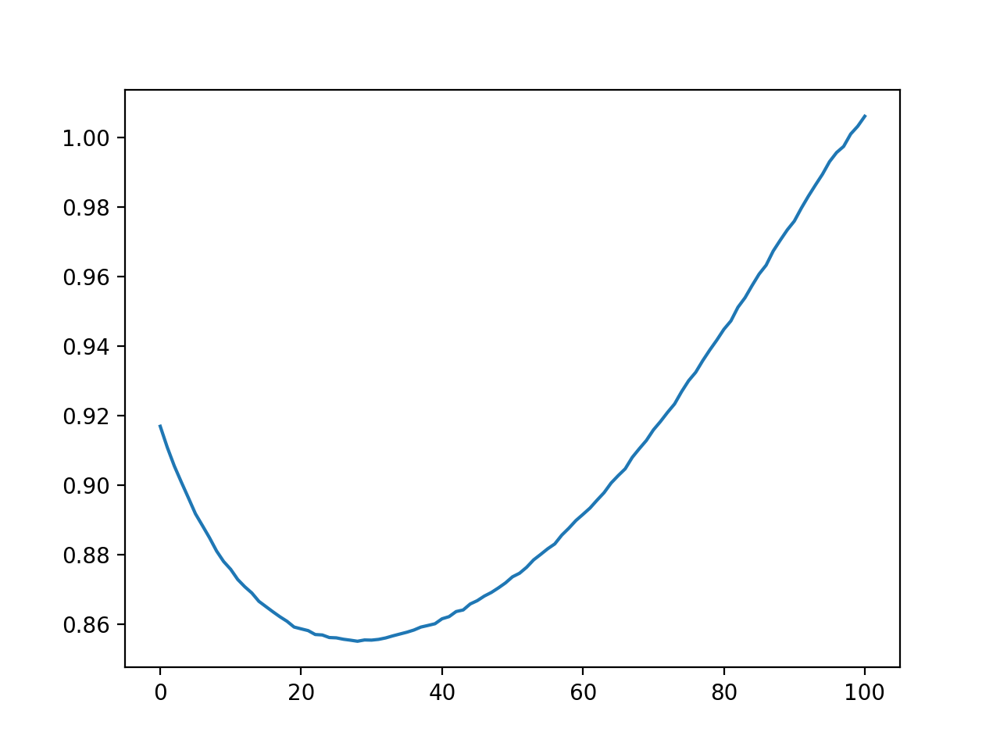

In [103]:
ratiod = np.array(totalratiog)/np.array(totalratioc)
plt.figure()
plt.plot(ratiod)

<IPython.core.display.Javascript object>


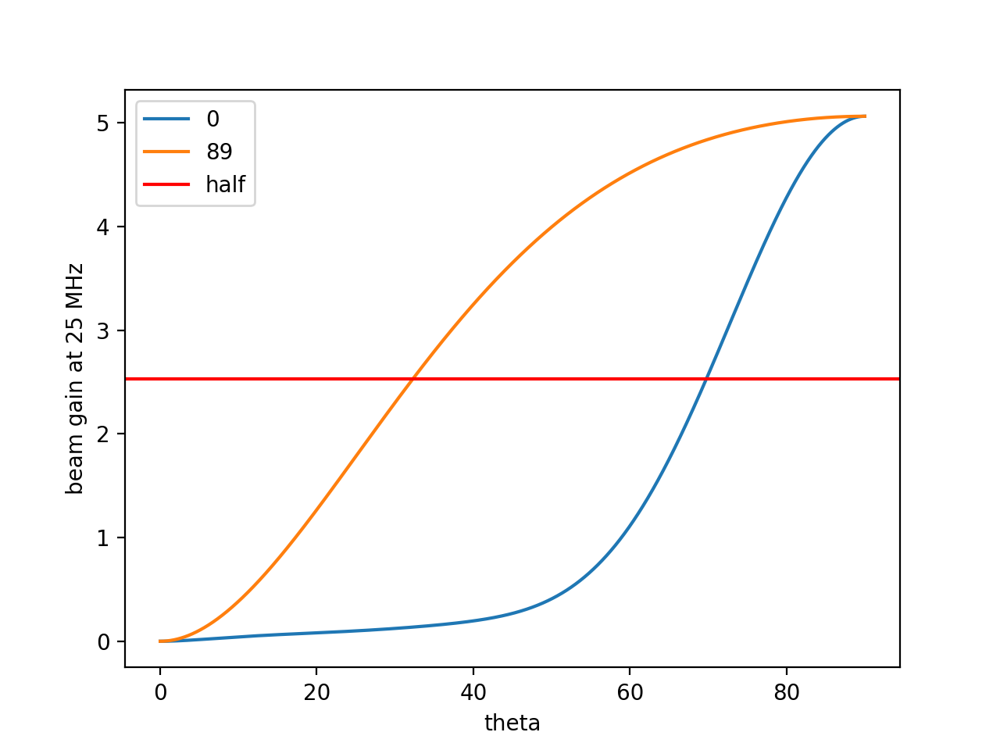

In [98]:
plt.figure(0)
plt.plot(xnew,inter1,label = "0")
plt.plot(xnew,inter2,label = "89")
plt.axhline(y = np.max(gain[100]/2), color='r', linestyle='-', label = "half")
plt.xlabel("theta")
plt.ylabel("beam gain at 25 MHz")
plt.legend()

In [12]:
#Normalization
def normalize(array):
    q = 0
    theta = 0
    while theta <= 90:
        for i in range(360):
            q += (array[theta*360 + i])**2 * (np.pi/180)**2 * np.sin(theta*np.pi/180)
        theta += 1
    return array/q

def TDH(rank):
    """return matrix A = [f1, f2, f3, ...] for rank 0 to rank TDH functions"""
    zz00c = Acos(newtheta, newphi, 0, 0)
    zz00c2d = zz00c.flatten()
    array = normalize(zz00c2d)
    r = 1
    while r <= rank:
        m = 0
        while m <= r:
            if (r - m)%2 == 0:
                n = (r - m)/2
                if m == 0:
                    cosine = Acos(newtheta,newphi,m,n)
                    cosine2d = cosine.flatten()
                    ncos = normalize(cosine2d)
                    array = np.vstack((array, ncos))
                    m += 2
                else:
                    cosine = Acos(newtheta,newphi,m,n)
                    cosine2d = cosine.flatten()
                    ncos = normalize(cosine2d)
                    sine = Asin(newtheta,newphi,m,n)
                    sine2d = sine.flatten()
                    nsin = normalize(sine2d)
                    array = np.vstack((array, ncos))
                    array = np.vstack((array, nsin))
                    m += 2
            else:
                m += 1
        r += 1
    matrix = np.matrix(array).T
    return matrix

'''def TDH(rank):
    """return matrix A = [f1, f2, f3, ...] for rank 0 to rank TDH functions"""
    zz00c = Acos(xx, yy, 0, 0)
    zz00c2d = zz00c.flatten()
    array = normalize(zz00c2d)
    r = 1
    while r <= rank:
        m = 0
        while m <= r:
            if (r - m)%2 == 0:
                n = (r - m)/2
                if m == 0:
                    cosine = Acos(xx,yy,m,n)
                    cosine2d = cosine.flatten()
                    ncos = normalize(cosine2d)
                    array = np.vstack((array, ncos))
                    m += 2
                else:
                    cosine = Acos(xx,yy,m,n)
                    cosine2d = cosine.flatten()
                    ncos = normalize(cosine2d)
                    sine = Asin(xx,yy,m,n)
                    sine2d = sine.flatten()
                    nsin = normalize(sine2d)
                    array = np.vstack((array, ncos))
                    array = np.vstack((array, nsin))
                    m += 2
            else:
                m += 1
        r += 1
    matrix = np.matrix(array).T
    return matrix'''

def model(rank, coe):
    A = TDH(rank)
    a = np.matrix(coe).T
    return np.matmul(A,a)

def simulation(coe, sigma):
    rank = 0
    count = 1
    length = len(coe) - 1
    while length > count:
        rank += 1
        count += rank + 1
    mo = model(rank,coe)
    noise = np.random.default_rng().normal(0.0, sigma*np.max(mo),360*91)
    noi = np.matrix(noise).T
    data = mo + noi
    return data

def solve(A, data):
    AT = A.T
    ATA = np.matmul(AT,A)
    ATAinverse = np.linalg.inv(ATA)
    half = np.matmul(ATAinverse,AT)
    x = np.matmul(half,data)
    return x

def residual(A,data):
    x = solve(A, data)
    AT = A.T
    fittingmodel = np.matmul(A, x)
    r = data - fittingmodel
    return r

def residual2D(A,data):
    r = residual(A,data)
    r2D = r.reshape(360,91)
    return r2D

'''def residual2D(A,data):
    coe = solve(A,data)
    fittingmodel = np.matmul(A, coe)
    fittingmodel2D = fittingmodel.reshape(360,91)
    return data.T.reshape(360,91)-fittingmodel2D'''

def covariance(A,data):
    AT = A.T
    ATA = np.matmul(AT,A)
    ATAinverse = np.linalg.inv(ATA)
    r = residual(A,data)
    rT = r.T
    rTr = np.matmul(rT,r)
    s = rTr/((len(data))-len(A.T)) 
    '''Originally: s = rTr/((len(data))-10). I think the 10 is weird.'''
    s2 = s.item(0)
    covariance = s2*ATAinverse
    return covariance

In [409]:
#Checking ranks
sigma = np.sqrt(0.6608*0.7033)*180/np.pi
A = TDH(7)
data = np.matrix(gain[0].T.flatten())
coe = solve(A,data.T)
finalresi = residual2D(A,data.T)
fittingmodel = np.matmul(A, coe)
fittingmodel2D = fittingmodel.reshape(360,91)
cov = covariance(A,data.T)

In [404]:
meansquare = np.sum(np.multiply(finalresi,finalresi))/(360*91)
rms = np.sqrt(meansquare)
rms/np.max(gain[100])*100

5.82396342640689

<IPython.core.display.Javascript object>


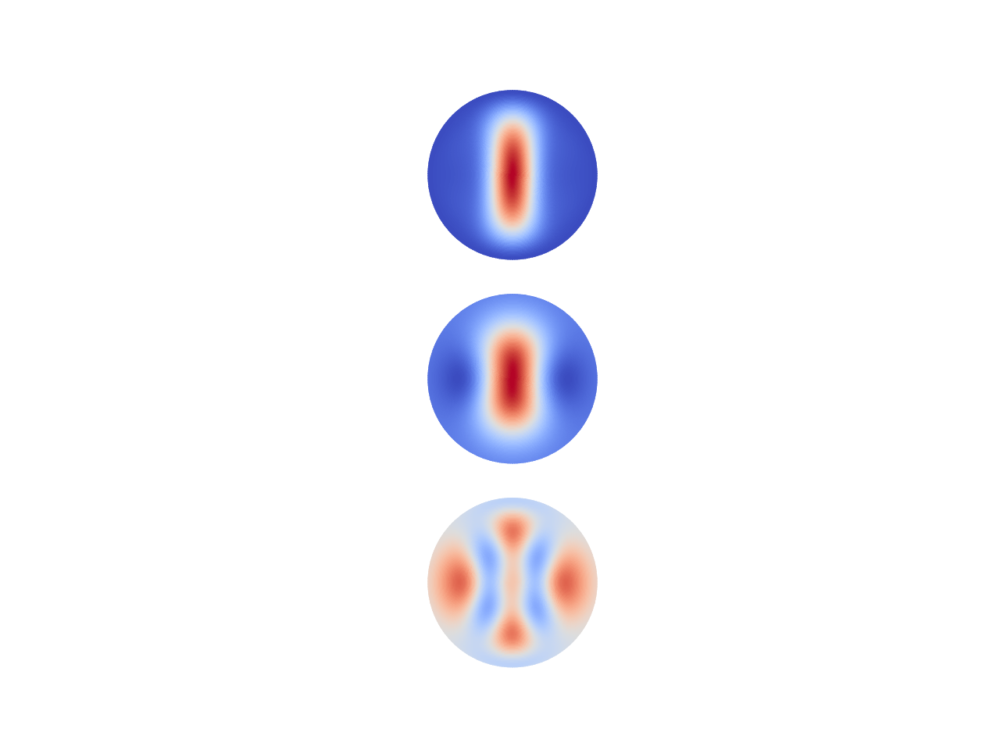

In [405]:
fig, axs = plt.subplots(3, 1, subplot_kw=dict(projection="polar"),sharex = True, sharey = True)
axs[0].pcolormesh(phi*np.pi/180,theta*np.pi/180,gain[100].T,cmap='coolwarm',shading='nearest')
axs[0].axis('off')
axs[1].pcolormesh(phi*np.pi/180,theta*np.pi/180,fittingmodel2D,cmap='coolwarm',shading='nearest')
axs[1].axis('off')
axs[2].pcolormesh(phi*np.pi/180,theta*np.pi/180,finalresi,cmap='coolwarm',shading='nearest', vmin = -1, vmax = 1)
axs[2].axis('off')
plt.savefig("125-rank3")

In [291]:
x1 = A.T[21]
x2 = A.T[26]
x3 = A.T[0]
x4 = A.T[24]
x5 = A.T[13]
x6 = A.T[4]
x7 = A.T[10]
x8 = A.T[11]

In [245]:
unc125 = np.sqrt(np.diag(cov))

0.0037007772769451232

In [ ]:
21,26,0,24,13,4,10, 11

In [256]:
np.sort(abs(coe125),axis = None)

matrix([[1.07448158e-06, 9.50465212e-06, 2.37544672e-05, 6.78060729e-05,
         1.02894851e-04, 1.18615494e-04, 1.45836426e-04, 2.62420407e-04,
         3.79483006e-04, 3.88674957e-04, 4.10213643e-04, 5.90136120e-04,
         6.31251173e-04, 6.35046429e-04, 6.48107729e-04, 6.60411786e-04,
         7.37609218e-04, 1.01307139e-03, 1.31768282e-03, 1.48737879e-03,
         1.55820078e-03, 1.84604464e-03, 2.10522360e-03, 2.25412074e-03,
         2.53273219e-03, 3.41067346e-03, 6.20436415e-01, 6.84509376e-01,
         1.72011726e+00, 1.99463290e+00, 2.87313697e+00, 3.93006850e+00,
         7.92157578e+00, 8.61518277e+00, 9.50783177e+00, 1.53474458e+01]])

In [261]:
for i in enumerate(abs(coe125)):
    print(i)

(0, matrix([[8.61518277]]))
(1, matrix([[0.00038867]]))
(2, matrix([[0.00026242]]))
(3, matrix([[0.62043641]]))
(4, matrix([[2.87313697]]))
(5, matrix([[0.00010289]]))
(6, matrix([[0.00014584]]))
(7, matrix([[9.50465212e-06]]))
(8, matrix([[0.00101307]]))
(9, matrix([[0.00063125]]))
(10, matrix([[1.9946329]]))
(11, matrix([[1.72011726]]))
(12, matrix([[2.37544672e-05]]))
(13, matrix([[3.9300685]]))
(14, matrix([[0.00011862]]))
(15, matrix([[6.78060729e-05]]))
(16, matrix([[1.07448158e-06]]))
(17, matrix([[0.00059014]]))
(18, matrix([[0.00064811]]))
(19, matrix([[0.00148738]]))
(20, matrix([[0.00037948]]))
(21, matrix([[15.34744581]]))
(22, matrix([[0.68450938]]))
(23, matrix([[0.00063505]]))
(24, matrix([[7.92157578]]))
(25, matrix([[0.00073761]]))
(26, matrix([[9.50783177]]))
(27, matrix([[0.00210522]]))
(28, matrix([[0.00225412]]))
(29, matrix([[0.00066041]]))
(30, matrix([[0.00184604]]))
(31, matrix([[0.0015582]]))
(32, matrix([[0.00341067]]))
(33, matrix([[0.00131768]]))
(34, matri

In [227]:
unc125[21], unc125[0], unc125[10], unc125[22], unc125[3], unc125[11]

(0.004645083657980413,
 5.6171430258815157e-05,
 0.001081128816637718,
 0.0017772230833051428,
 0.00017032377544129066,
 0.0003770724729436315)

In [ ]:
21,0,10,22

In [407]:
A.T.shape

(10, 32760)

In [410]:
x1 = A.T[21]
x2 = A.T[0]
x3 = A.T[10]
x4 = A.T[22]

In [274]:
coe25[21]

matrix([[-2.49169213]])

In [120]:
coe25 = coe

In [126]:
coe125 = coe

In [273]:
for i in enumerate(abs(coe25)):
    print(i)

(0, matrix([[1.30621453]]))
(1, matrix([[3.06303337e-05]]))
(2, matrix([[2.13330321e-06]]))
(3, matrix([[0.16387945]]))
(4, matrix([[0.01684398]]))
(5, matrix([[2.71779644e-06]]))
(6, matrix([[3.11481471e-05]]))
(7, matrix([[1.6778282e-06]]))
(8, matrix([[1.61061753e-07]]))
(9, matrix([[8.1557585e-08]]))
(10, matrix([[1.12087203]]))
(11, matrix([[0.05489752]]))
(12, matrix([[7.46805545e-06]]))
(13, matrix([[0.002088]]))
(14, matrix([[2.13291305e-07]]))
(15, matrix([[0.00026094]]))
(16, matrix([[1.69298286e-06]]))
(17, matrix([[2.05319569e-06]]))
(18, matrix([[1.2754427e-06]]))
(19, matrix([[1.68223107e-08]]))
(20, matrix([[2.77076971e-08]]))
(21, matrix([[2.49169213]]))
(22, matrix([[0.38260364]]))
(23, matrix([[3.9693555e-06]]))
(24, matrix([[0.00894669]]))
(25, matrix([[5.44366907e-07]]))
(26, matrix([[3.83101758e-05]]))
(27, matrix([[1.05494199e-06]]))
(28, matrix([[0.00071051]]))
(29, matrix([[1.12798544e-05]]))
(30, matrix([[8.99315335e-06]]))
(31, matrix([[2.69748826e-06]]))
(32,

In [179]:
np.max(abs(coe25))

2.491692126477239

In [251]:
eigenvalues125 = np.sort(np.abs(coe125), axis = None)/1.53474458e+01
eigenvalues25 = np.sort(np.abs(coe25), axis = None)/2.491692126477239

In [242]:
x125[8]

0.044600866144194805

In [181]:
x125 = np.array(eigenvalues125).flatten()
x125 = np.flip(x125)
x25 = np.array(eigenvalues25).flatten()
x25 = np.flip(x25)

In [316]:
eigenvalues125

matrix([[7.00104496e-08, 6.19298628e-07, 1.54777984e-06, 4.41806889e-06,
         6.70436319e-06, 7.72867975e-06, 9.50232551e-06, 1.70986371e-05,
         2.47261343e-05, 2.53250582e-05, 2.67284634e-05, 3.84517481e-05,
         4.11306989e-05, 4.13779880e-05, 4.22290287e-05, 4.30307293e-05,
         4.80607149e-05, 6.60091202e-05, 8.58568152e-05, 9.69137675e-05,
         1.01528346e-04, 1.20283509e-04, 1.37170942e-04, 1.46872696e-04,
         1.65026300e-04, 2.22230690e-04, 4.04260372e-02, 4.46008661e-02,
         1.12078406e-01, 1.29965137e-01, 1.87206197e-01, 2.56073131e-01,
         5.16149455e-01, 5.61343098e-01, 6.19505805e-01, 1.00000000e+00]])

<IPython.core.display.Javascript object>


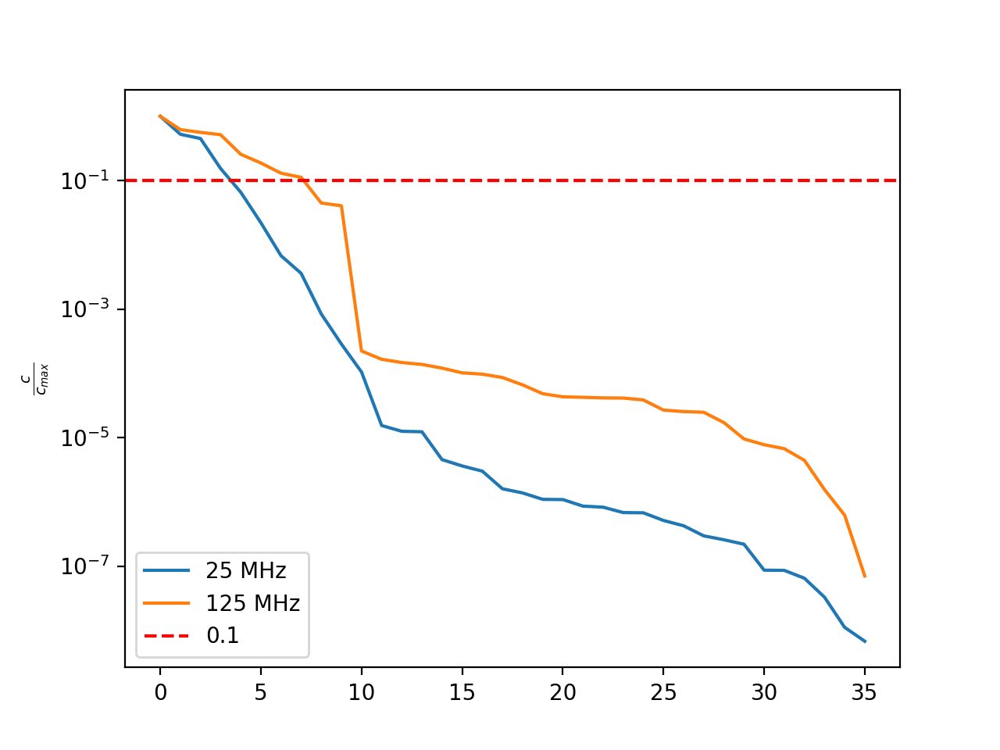

In [317]:
plt.figure()
plt.plot(x25, label = "25 MHz")
plt.plot(x125, label = "125 MHz")
plt.yscale("log")
plt.axhline(y = 0.1, color='r', linestyle='--', label = "0.1")
plt.legend()
plt.ylabel(r'$\frac{c}{c_{max}}$')
plt.savefig("eigen")

In [128]:
np.sort(np.abs(coe125), axis = None)/1.72011726e+00

matrix([[6.24656007e-07, 5.52558383e-06, 1.38097953e-05, 3.94194480e-05,
         5.98185096e-05, 6.89577951e-05, 8.47828396e-05, 1.52559603e-04,
         2.20614615e-04, 2.25958408e-04, 2.38480046e-04, 3.43079006e-04,
         3.66981477e-04, 3.69187871e-04, 3.76781133e-04, 3.83934166e-04,
         4.28813334e-04, 5.88954845e-04, 7.66042437e-04, 8.64696162e-04,
         9.05868930e-04, 1.07320860e-03, 1.22388377e-03, 1.31044597e-03,
         1.47241833e-03, 1.98281451e-03, 3.60694256e-01, 3.97943438e-01,
         1.00000000e+00, 1.15959124e+00, 1.67031460e+00, 2.28476778e+00,
         4.60525336e+00, 5.00848574e+00, 5.52743234e+00, 8.92232533e+00]])

In [121]:
2.49169213/5.48975193e-02

45.38806419254722

In [100]:
x = A.T[0]*1.3+A.T[10]*(-1.12)+A.T[21]*(-2.49)+A.T[3]*(-1.63e-1)+A.T[22]*(-3.83e-1)+A.T[11]*5.49e-2

In [286]:
x1 = A.T[21]
x2 = A.T[0]
x3 = A.T[10]
x4 = A.T[22]
x5 = A.T[3]
x6 = A.T[11]

In [131]:
np.max(A.T[0])

0.549950898183565

<IPython.core.display.Javascript object>


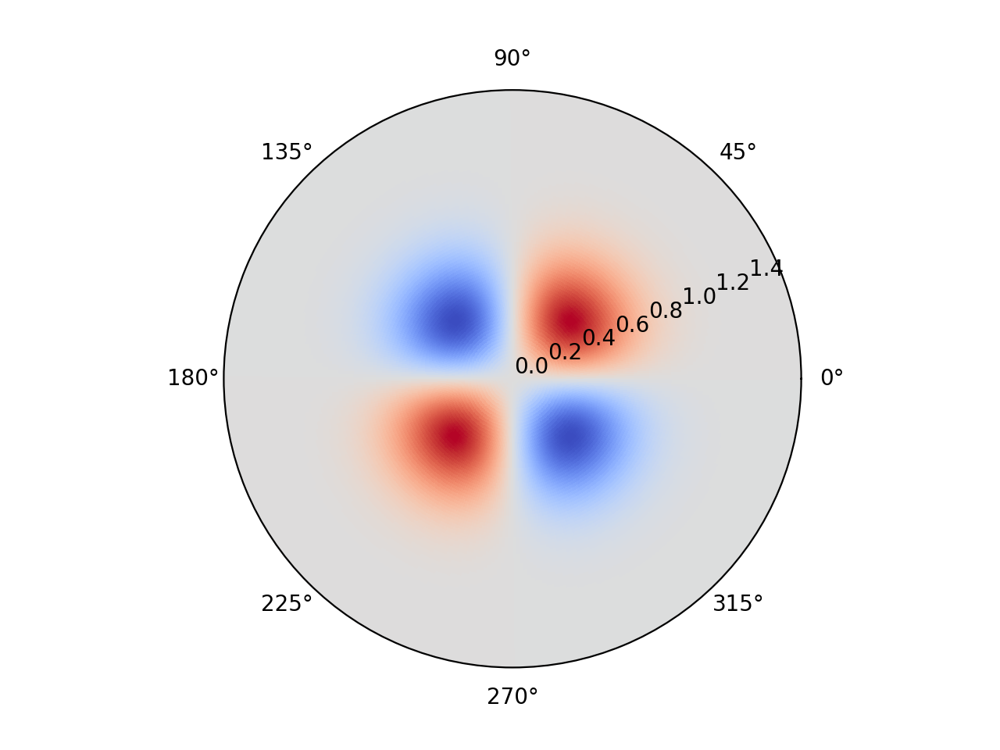

In [445]:
fig, axs = plt.subplots(1, 1, subplot_kw=dict(projection="polar"))
axs.pcolormesh(phi*np.pi/180,theta*np.pi/180,zz20s.reshape(360,91),cmap='coolwarm', shading = 'nearest')

In [102]:
resi = x.reshape(360,91)-gain[0].T
np.max(abs(resi))

0.015313781516818639

In [99]:
np.max(abs(resi))/np.max(gain[0])

0.03618466536097882

<IPython.core.display.Javascript object>


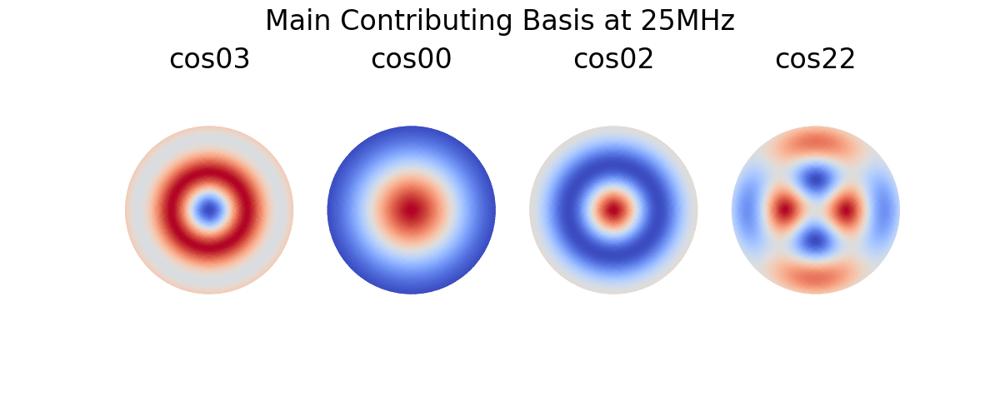

In [411]:
fig, axs = plt.subplots(1, 4, subplot_kw=dict(projection="polar"),figsize = (6,2.5),sharex = True, sharey = True)
fig.suptitle('Main Contributing Basis at 25MHz')
#21, r6
axs[0].pcolormesh(phi*np.pi/180,theta*np.pi/180,x1.reshape(360,91),cmap='coolwarm',shading='nearest')
axs[0].axis('off')
axs[0].set_title('cos03')

#0 r0
axs[1].pcolormesh(phi*np.pi/180,theta*np.pi/180,x2.reshape(360,91),cmap='coolwarm',shading='nearest')
axs[1].axis('off')
axs[1].set_title('cos00')

#10 r4
axs[2].pcolormesh(phi*np.pi/180,theta*np.pi/180,x3.reshape(360,91),cmap='coolwarm',shading='nearest')
axs[2].axis('off')
axs[2].set_title('cos02')

#22 r6
axs[3].pcolormesh(phi*np.pi/180,theta*np.pi/180,x4.reshape(360,91),cmap='coolwarm',shading='nearest')
axs[3].axis('off')
axs[3].set_title('cos22')

plt.savefig("25main")

<IPython.core.display.Javascript object>


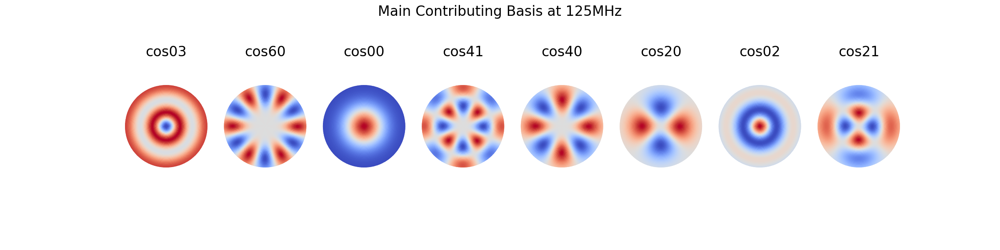

In [307]:
fig, axs = plt.subplots(1, 8, subplot_kw=dict(projection="polar"),figsize = (12,3),sharex = True, sharey = True)
fig.suptitle('Main Contributing Basis at 125MHz')

#21, r6
axs[0].pcolormesh(phi*np.pi/180,theta*np.pi/180,x1.reshape(360,91),cmap='coolwarm',shading='nearest')
axs[0].axis('off')
axs[0].set_title('cos03')

#26 r6
axs[1].pcolormesh(phi*np.pi/180,theta*np.pi/180,x2.reshape(360,91),cmap='coolwarm',shading='nearest')
axs[1].axis('off')
axs[1].set_title('cos60')

#0 r0
axs[2].pcolormesh(phi*np.pi/180,theta*np.pi/180,x3.reshape(360,91),cmap='coolwarm',shading='nearest')
axs[2].axis('off')
axs[2].set_title('cos00')

#24 r6
axs[3].pcolormesh(phi*np.pi/180,theta*np.pi/180,x4.reshape(360,91),cmap='coolwarm',shading='nearest')
axs[3].axis('off')
axs[3].set_title('cos41')

#13 r4
axs[4].pcolormesh(phi*np.pi/180,theta*np.pi/180,x5.reshape(360,91),cmap='coolwarm',shading='nearest')
axs[4].axis('off')
axs[4].set_title('cos40')

#4 r2
axs[5].pcolormesh(phi*np.pi/180,theta*np.pi/180,x6.reshape(360,91),cmap='coolwarm',shading='nearest')
axs[5].axis('off')
axs[5].set_title('cos20')

#10 r4
axs[6].pcolormesh(phi*np.pi/180,theta*np.pi/180,x7.reshape(360,91),cmap='coolwarm',shading='nearest')
axs[6].axis('off')
axs[6].set_title('cos02')

#11 r4
axs[7].pcolormesh(phi*np.pi/180,theta*np.pi/180,x8.reshape(360,91),cmap='coolwarm',shading='nearest')
axs[7].axis('off')
axs[7].set_title('cos21')
plt.savefig("125main")

In [375]:
15.83,3.83,5.82,5.82,2.55,2.55,0.82,0.82

(16.77, 16.77, 5.87, 5.87, 1.32, 1.32, 0.86, 0.86)

In [229]:
fig, axs = plt.subplots(1, 1, subplot_kw=dict(projection="polar"))
axs.pcolormesh(phi*np.pi/180,theta*np.pi/180,data.reshape(91,360).T,cmap='coolwarm', shading = 'nearest')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


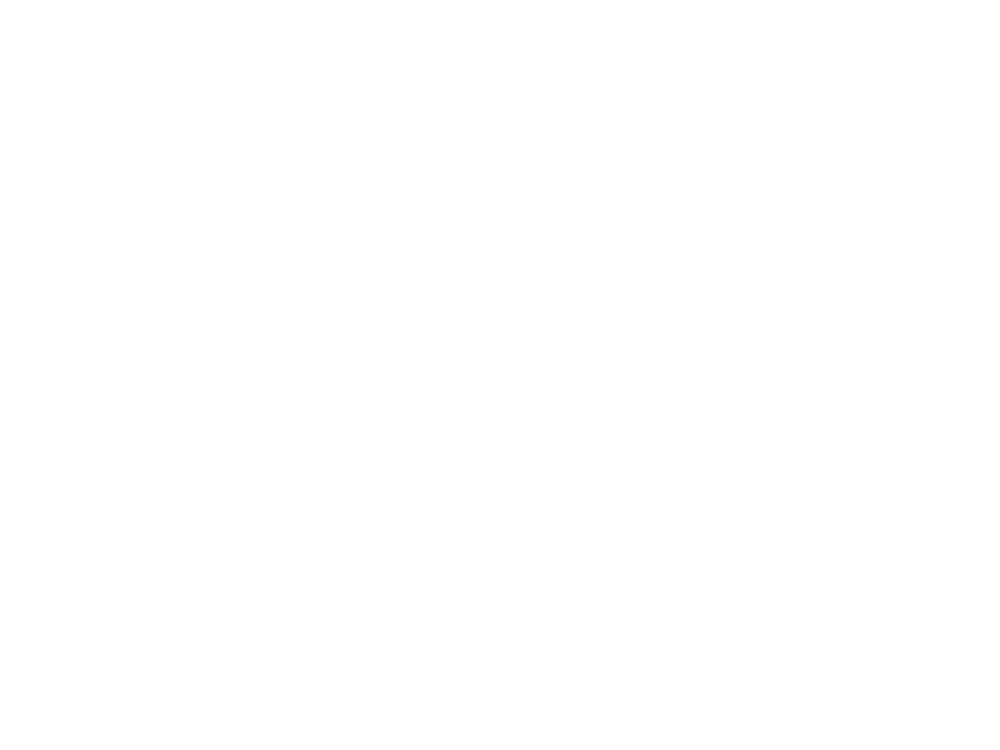

In [155]:
fig, axs = plt.subplots(1, 3, subplot_kw=dict(projection="polar"),sharex = True, sharey = True)
axs[0].pcolormesh(phi*np.pi/180,theta*np.pi/180,gain[0].T,cmap='coolwarm',shading='nearest')
axs[0].axis('off')
axs[0].set_title("(a) 25 MHz")
axs[1].pcolormesh(phi*np.pi/180,theta*np.pi/180,gain[50].T,cmap='coolwarm',shading='nearest')
axs[1].axis('off')
axs[1].set_title("(a) 75 MHz")
axs[2].pcolormesh(phi*np.pi/180,theta*np.pi/180,gain[100].T,cmap='coolwarm',shading='nearest')
axs[2].axis('off')
axs[2].set_title("(a) 125 MHz")
#plt.savefig("3freqs")

# One at a Time

In [9]:
theta = xx
phi = yy

In [10]:
newtheta = theta
newphi = phi

25MHz

In [13]:
sigma = np.sqrt(0.5353*0.6612)*180/np.pi
A = TDH(7)

In [14]:
data = np.matrix(gain[0].T.flatten())
rmstotal25 = []
for i in range(36):
    cur = A.T[i]
    finalresi = residual2D(cur.T,data.T)
    meansquare = np.sum(np.multiply(finalresi,finalresi))/(360*91)
    rms = np.sqrt(meansquare)
    rmstotal25.append(rms)

In [15]:
rms25 = np.sqrt(np.sum(np.multiply(data.T,data.T))/(360*91))
rms25

0.33285194587765354

In [16]:
rmstotal25 = np.array(rmstotal25)

In [17]:
fa25 = (1 - rmstotal25/rms25)

In [18]:
fa25>0.1

array([ True, False, False,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False])

In [19]:
for i in enumerate(fa25):
    print(i)

(0, 0.8782101669067646)
(1, 6.212074188383099e-10)
(2, 3.381961377613152e-12)
(3, 0.13161276180273374)
(4, 0.0002830384375784867)
(5, 4.122702179643056e-12)
(6, 6.783018591249856e-12)
(7, 5.405675906899887e-13)
(8, 1.2323475573339238e-14)
(9, 5.551115123125783e-15)
(10, 0.09121767918262735)
(11, 0.00042610192030712035)
(12, 2.1257440252497872e-12)
(13, 1.7156387421835007e-11)
(14, 0.0)
(15, 2.992051051364797e-13)
(16, 8.959499808725013e-14)
(17, 1.3322676295501878e-15)
(18, 2.6645352591003757e-15)
(19, 0.0)
(20, 0.0)
(21, 0.09077518985708799)
(22, 0.0001952223714685175)
(23, 4.948264020754323e-13)
(24, 1.49965583284839e-08)
(25, 0.0)
(26, 1.8207657603852567e-13)
(27, 2.220446049250313e-16)
(28, 5.550893078520858e-12)
(29, 5.0737192225369654e-14)
(30, 2.220446049250313e-16)
(31, 0.0)
(32, 0.0)
(33, 0.0)
(34, 2.220446049250313e-16)
(35, 0.0)


In [20]:
np.flip(np.sort(fa25, axis = None))

array([8.78210167e-01, 1.31612762e-01, 9.12176792e-02, 9.07751899e-02,
       4.26101920e-04, 2.83038438e-04, 1.95222371e-04, 1.49965583e-08,
       6.21207419e-10, 1.71563874e-11, 6.78301859e-12, 5.55089308e-12,
       4.12270218e-12, 3.38196138e-12, 2.12574403e-12, 5.40567591e-13,
       4.94826402e-13, 2.99205105e-13, 1.82076576e-13, 8.95949981e-14,
       5.07371922e-14, 1.23234756e-14, 5.55111512e-15, 2.66453526e-15,
       1.33226763e-15, 2.22044605e-16, 2.22044605e-16, 2.22044605e-16,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00])

In [23]:
maxind25 = []
for i in range(7):
    maxind25.append(np.where(abs(fa25) == np.sort(abs(fa25),axis = None).T[35-i])[0][0])

In [24]:
order = ['cos00','cos10','sin10','cos01','cos20','sin20','cos11','sin11','cos30','sin30',
        'cos02','cos21','sin21','cos40','sin40','cos12','sin12','cos31','sin31','cos50',
        'sin50','cos03','cos22','sin22','cos41','sin41','cos60','sin60','cos13','sin13',
        'cos32','sin32','cos51','sin51','cos70','sin70'
        ]

In [25]:
for i in range(7):
    print(order[maxind25[i]])

cos00
cos01
cos02
cos03
cos21
cos20
cos22


<IPython.core.display.Javascript object>


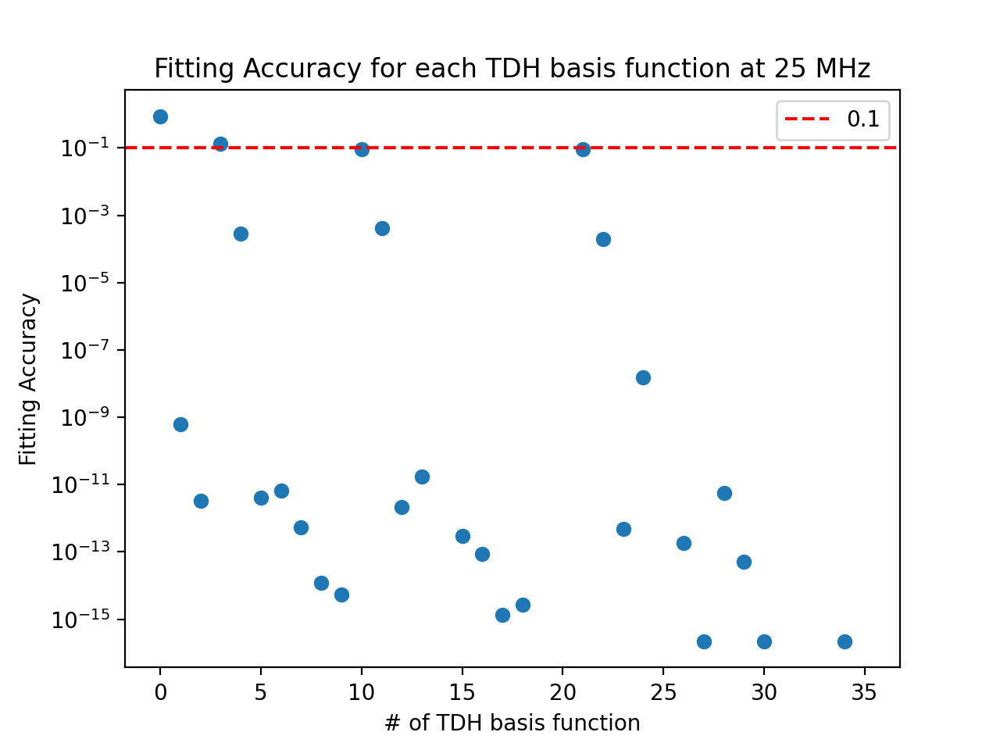

Text(0.5, 1.0, 'Fitting Accuracy for each TDH basis function at 25 MHz')

In [21]:
plt.figure()
plt.plot(fa25, 'o')
plt.axhline(y = 0.1, color='r', linestyle='--', label = "0.1")
plt.yscale('log')
plt.legend()
plt.ylabel("Fitting Accuracy")
plt.xlabel('# of TDH basis function')
plt.title('Fitting Accuracy for each TDH basis function at 25 MHz')

<IPython.core.display.Javascript object>


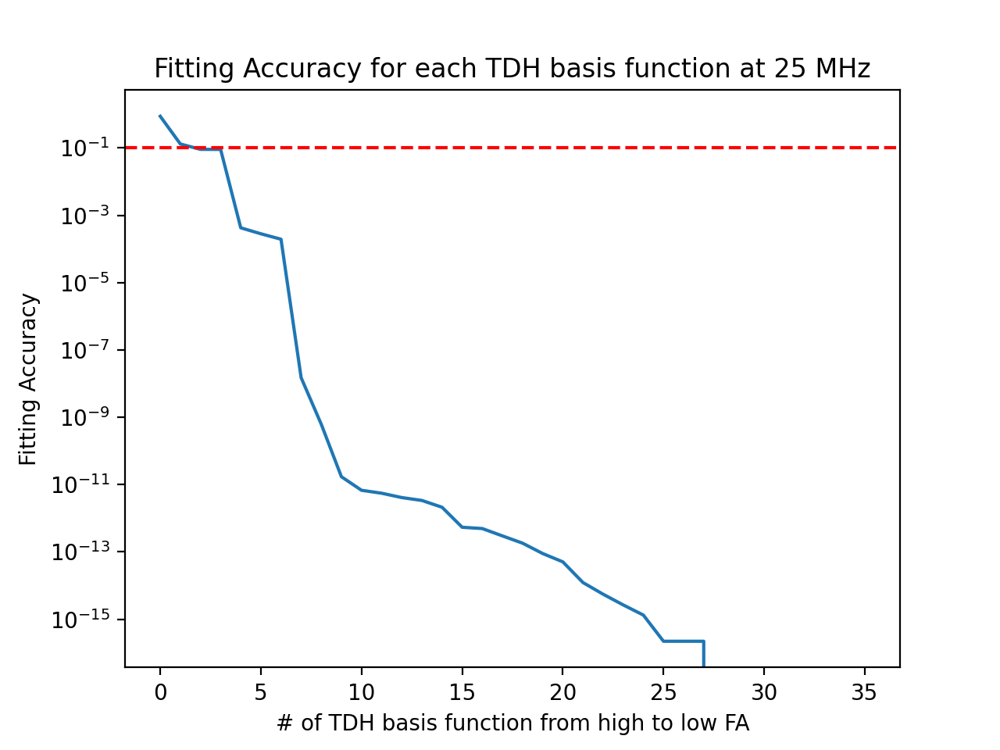

Text(0.5, 1.0, 'Fitting Accuracy for each TDH basis function at 25 MHz')

In [22]:
plt.figure()
plt.plot(np.flip(np.sort(fa25, axis = None)))
plt.yscale('log')
plt.axhline(y = 0.1, color='r', linestyle='--', label = "0.1")
plt.ylabel("Fitting Accuracy")
plt.xlabel('# of TDH basis function from high to low FA')
plt.title('Fitting Accuracy for each TDH basis function at 25 MHz')

125MHz

In [81]:
sigma = np.sqrt(0.3146*0.8245)*180/np.pi
A = TDH(7)

In [11]:
x0 = A.T[0]
x1 = A.T[1]
x2 = A.T[2]
x3 = A.T[3]
x4 = A.T[4]
x5 = A.T[5]
x6 = A.T[6]
x7 = A.T[7]
x8 = A.T[8]
x9 = A.T[9]
x10 = A.T[10]
x11 = A.T[11]
x12 = A.T[12]
x13 = A.T[13]
x14 = A.T[14]
x15 = A.T[15]
x16 = A.T[16]
x17 = A.T[17]
x18 = A.T[18]
x19 = A.T[19]
x20 = A.T[20]
x21 = A.T[21]
x22 = A.T[22]
x23 = A.T[23]
x24 = A.T[24]
x25 = A.T[25]
x26 = A.T[26]
x27 = A.T[27]
x28 = A.T[28]
x29 = A.T[29]
x30 = A.T[30]
x31 = A.T[31]
x32 = A.T[32]
x33 = A.T[33]
x34 = A.T[34]
x35 = A.T[35]

In [57]:
data = np.matrix(gain[100].T.flatten())
rmstotal125 = []
for i in range(36):
    cur = A.T[i]
    finalresi = residual2D(cur.T,data.T)
    meansquare = np.sum(np.multiply(finalresi,finalresi))/(360*91)
    rms = np.sqrt(meansquare)
    rmstotal125.append(rms)

In [58]:
rms125 = np.sqrt(np.sum(np.multiply(data.T,data.T))/(360*91))
rms125

2.699242197326686

In [59]:
rmstotal125 = np.array(rmstotal125)

In [60]:
fa125 = (1 - rmstotal125/rms125)

In [79]:
for i in enumerate(fa125):
    print(i)

(0, 0.7030369075876015)
(1, 2.1684932738352813e-09)
(2, 8.263597583990645e-10)
(3, 0.17264313797609054)
(4, 0.038879716345101456)
(5, 3.913558366264169e-11)
(6, 5.571266781245754e-10)
(7, 1.3261169939937645e-10)
(8, 9.082194996068438e-10)
(9, 3.6891334431743417e-10)
(10, 0.13487343924376605)
(11, 0.008698815399715953)
(12, 1.607047828144914e-12)
(13, 0.002477586619368699)
(14, 4.2510439612897244e-13)
(15, 2.522336783883361e-10)
(16, 6.349376580061517e-11)
(17, 1.3596190839848532e-10)
(18, 8.155043307311871e-11)
(19, 4.425571020760799e-11)
(20, 3.3812952437983768e-12)
(21, 0.1202252579481885)
(22, 0.0025534684617191106)
(23, 1.2458922782343507e-12)
(24, 0.001241979992478881)
(25, 2.5124347047267293e-12)
(26, 0.00011881590772222506)
(27, 5.763944876946425e-12)
(28, 1.9597512501690062e-10)
(29, 4.899514127743032e-11)
(30, 9.884426610540231e-12)
(31, 6.936673457857978e-12)
(32, 2.6278423881365143e-11)
(33, 2.8630431359033537e-12)
(34, 7.132072710192006e-13)
(35, 1.8540724511240114e-14)


In [80]:
np.flip(np.sort(fa125, axis = None))

array([7.03036908e-01, 1.72643138e-01, 1.34873439e-01, 1.20225258e-01,
       3.88797163e-02, 8.69881540e-03, 2.55346846e-03, 2.47758662e-03,
       1.24197999e-03, 1.18815908e-04, 2.16849327e-09, 9.08219500e-10,
       8.26359758e-10, 5.57126678e-10, 3.68913344e-10, 2.52233678e-10,
       1.95975125e-10, 1.35961908e-10, 1.32611699e-10, 8.15504331e-11,
       6.34937658e-11, 4.89951413e-11, 4.42557102e-11, 3.91355837e-11,
       2.62784239e-11, 9.88442661e-12, 6.93667346e-12, 5.76394488e-12,
       3.38129524e-12, 2.86304314e-12, 2.51243470e-12, 1.60704783e-12,
       1.24589228e-12, 7.13207271e-13, 4.25104396e-13, 1.85407245e-14])

<IPython.core.display.Javascript object>


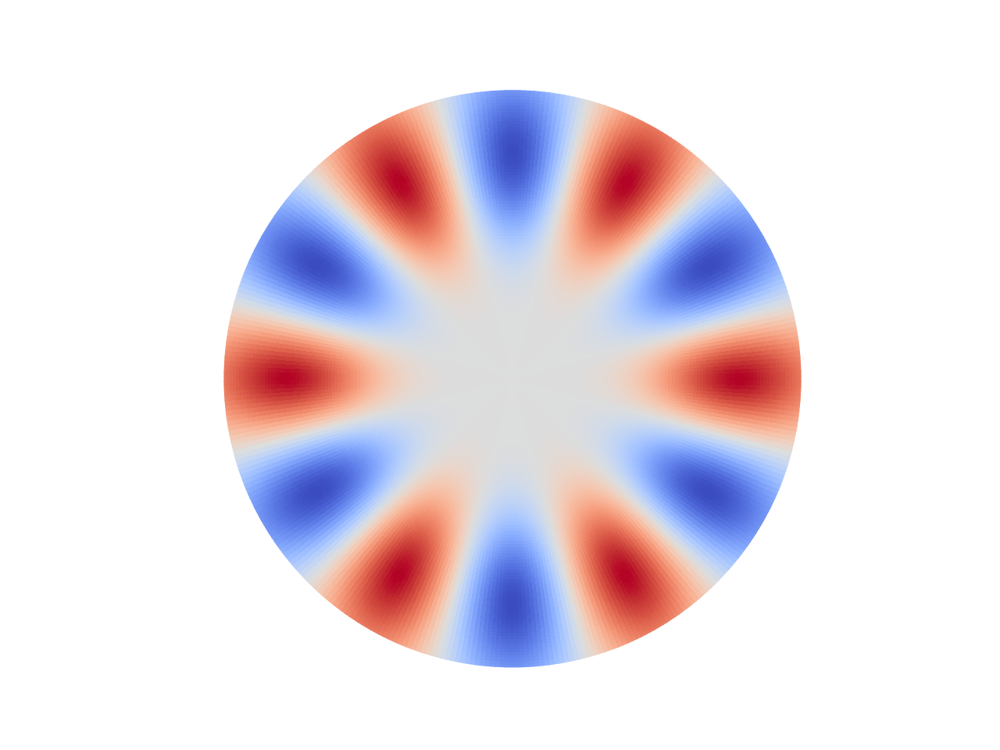

In [94]:
fig, axs = plt.subplots(1, 1, subplot_kw=dict(projection="polar"))
axs.pcolormesh(phi*np.pi/180,theta*np.pi/180,A.T[26].reshape(360,91),cmap='coolwarm', shading = 'nearest')
axs.axis('off')
plt.savefig("125_9")

<IPython.core.display.Javascript object>


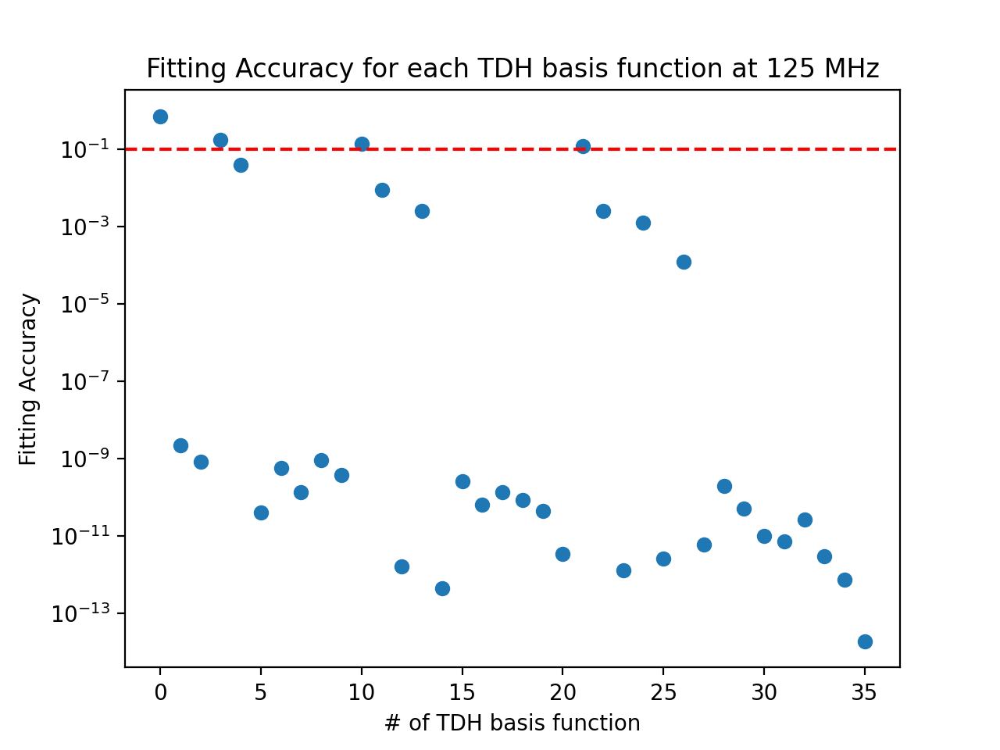

Text(0.5, 1.0, 'Fitting Accuracy for each TDH basis function at 125 MHz')

In [72]:
plt.figure()
plt.plot(fa125, 'o')
plt.axhline(y = 0.1, color='r', linestyle='--', label = "0.1")
plt.yscale('log')
plt.ylabel("Fitting Accuracy")
plt.xlabel('# of TDH basis function')
plt.title('Fitting Accuracy for each TDH basis function at 125 MHz')

<IPython.core.display.Javascript object>


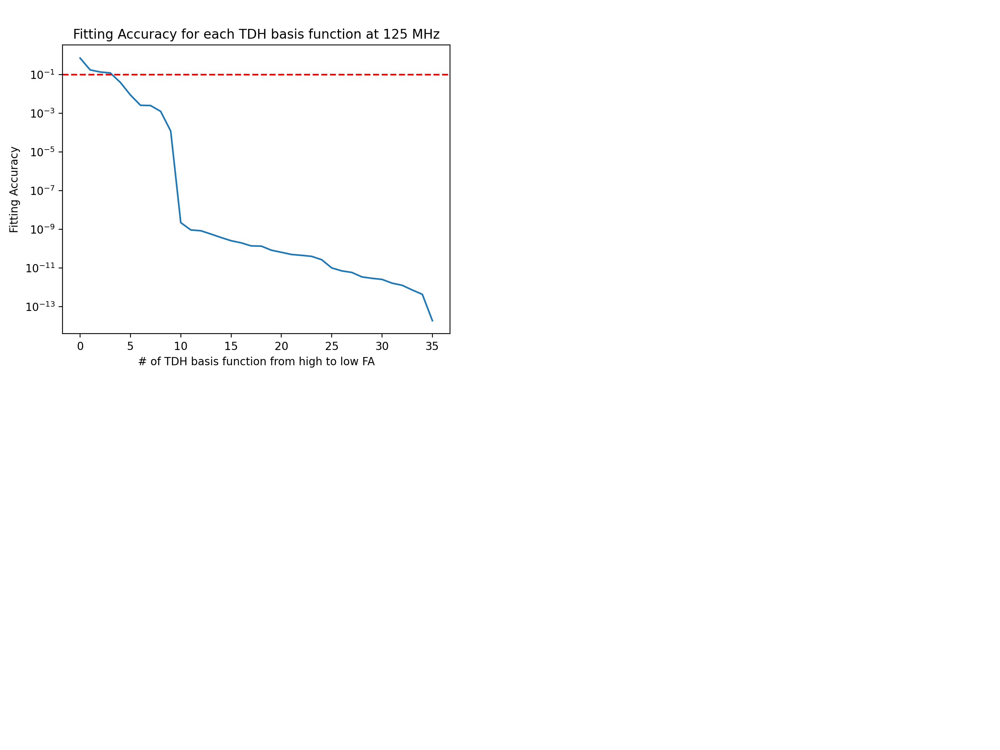

Text(0.5, 1.0, 'Fitting Accuracy for each TDH basis function at 125 MHz')

In [63]:
plt.figure()
plt.plot(np.flip(np.sort(fa125, axis = None)))
plt.yscale('log')
plt.axhline(y = 0.1, color='r', linestyle='--', label = "0.1")
plt.ylabel("Fitting Accuracy")
plt.xlabel('# of TDH basis function from high to low FA')
plt.title('Fitting Accuracy for each TDH basis function at 125 MHz')

In [106]:
#For 25 MHz
59.73+12.39+0.012+7.61+0.031+6.21+0.025

86.00800000000001

In [13]:
data = np.matrix(gain[100].T.flatten())
finalresi = residual2D(x10.T,data.T)
meansquare = np.sum(np.multiply(finalresi,finalresi))/(360*91)
rms = np.sqrt(meansquare)
rms/np.max(gain[100])*100, 53.3214381790786-rms/np.max(gain[100])*100

(46.12979242644241, 7.191645752636191)

In [14]:
np.sqrt(np.sum(np.multiply(data.T,data.T))/(360*91))/np.max(gain[100])*100

53.3214381790786

<IPython.core.display.Javascript object>


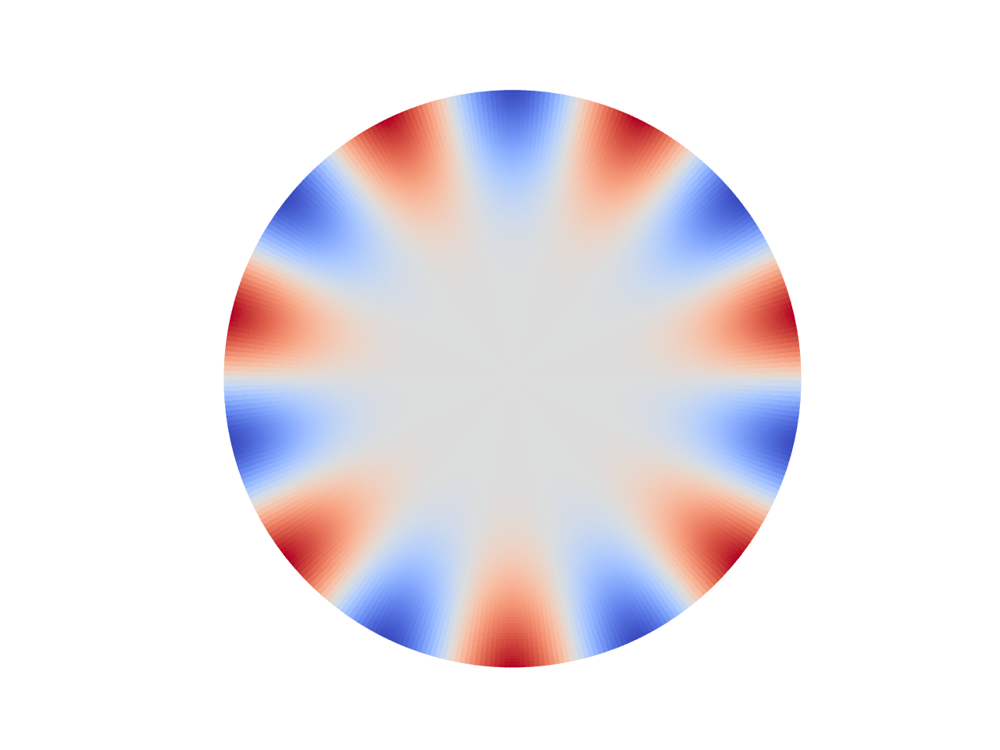

(0.0, 6.283185307179586, -0.008726646259971648, 1.579522973054868)

In [94]:
fig, axs = plt.subplots(1, 1, subplot_kw=dict(projection="polar"))
axs.pcolormesh(phi*np.pi/180,theta*np.pi/180,x35.reshape(360,91),cmap='coolwarm', shading = 'nearest')
axs.axis('off')

<IPython.core.display.Javascript object>


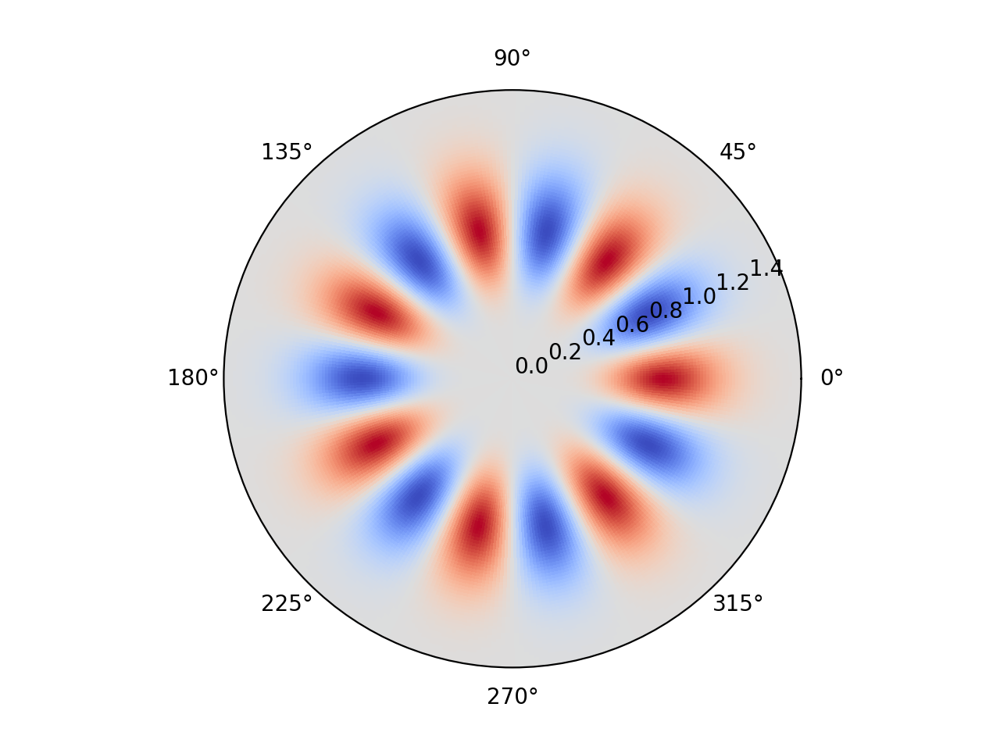

In [92]:
fig, axs = plt.subplots(1, 1, subplot_kw=dict(projection="polar"))
axs.pcolormesh(phi*np.pi/180,theta*np.pi/180,zz70c.reshape(360,91),cmap='coolwarm', shading = 'nearest')